Connected to .venv (Python 3.10.11)

In [ ]:
from datasets import Dataset
from PIL import Image
import os

ModuleNotFoundError: No module named 'datasets'

Connected to ANKITRAJSH2 (Python 3.12.3)

In [ ]:
from datasets import Dataset
from PIL import Image
import os

ModuleNotFoundError: No module named 'datasets'

In [ ]:
!pip install datasets

  Using cached datasets-3.2.0-py3-none-any.whl.metadata (20 kB)
  Using cached pyarrow-18.1.0-cp312-cp312-win_amd64.whl.metadata (3.4 kB)
  Using cached dill-0.3.8-py3-none-any.whl.metadata (10 kB)
  Using cached pandas-2.2.3-cp312-cp312-win_amd64.whl.metadata (19 kB)
  Using cached tqdm-4.67.1-py3-none-any.whl.metadata (57 kB)
  Using cached xxhash-3.5.0-cp312-cp312-win_amd64.whl.metadata (13 kB)
  Using cached multiprocess-0.70.16-py312-none-any.whl.metadata (7.2 kB)
  Using cached fsspec-2024.9.0-py3-none-any.whl.metadata (11 kB)
  Using cached aiohttp-3.11.11-cp312-cp312-win_amd64.whl.metadata (8.0 kB)
  Using cached huggingface_hub-0.27.0-py3-none-any.whl.metadata (13 kB)
  Using cached aiohappyeyeballs-2.4.4-py3-none-any.whl.metadata (6.1 kB)
  Using cached aiosignal-1.3.2-py2.py3-none-any.whl.metadata (3.8 kB)
  Using cached attrs-24.3.0-py3-none-any.whl.metadata (11 kB)
  Using cached frozenlist-1.5.0-cp312-cp312-win_amd64.whl.metadata (14 kB)
  Using cached multidict-6.1.0-cp3

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.5.1 requires sympy==1.13.1; python_version >= "3.9", but you have sympy 1.13.3 which is incompatible.


In [ ]:
from datasets import Dataset

c:\USERS\NISHITH\MINICONDA3\ENVS\ANKITRAJSH2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
from PIL import Image

In [ ]:
import os

In [ ]:
import torch

print("Number of GPU: ", torch.cuda.device_count())
print("GPU Name: ", torch.cuda.get_device_name())

Number of GPU:  1
GPU Name:  NVIDIA GeForce RTX 3060 Ti


In [ ]:
image_dir = 'G:/sernetdata/AGGC2022_train/Processed5/Images'
mask_dir = 'G:/sernetdata/AGGC2022_train/Processed5/Masks'
    # Path to the directory containing mask files

# Retrieve the list of image and mask filenames
image_files = os.listdir(image_dir)
mask_files = os.listdir(mask_dir)

# Sort the lists to ensure corresponding images and masks align (if filenames are matching)
image_files.sort()
mask_files.sort()

# Function to load images safely
def load_images(files, directory):
    images = []
    for file in files:
        with Image.open(os.path.join(directory, file)) as img:
            images.append(img.copy())  # Important to use copy() to keep the image after closing the file
    return images

# Load images and masks into a dictionary
dataset_dict = {
    "image": load_images(image_files, image_dir),
    "label": load_images(mask_files, mask_dir)
}

# Create the dataset using the datasets.Dataset class
dataset = Dataset.from_dict(dataset_dict)

In [ ]:
dataset

Dataset({
    features: ['image', 'label'],
    num_rows: 37555
})

In [ ]:
!pip install matplotlib

  Using cached matplotlib-3.10.0-cp312-cp312-win_amd64.whl.metadata (11 kB)
  Using cached contourpy-1.3.1-cp312-cp312-win_amd64.whl.metadata (5.4 kB)
  Using cached cycler-0.12.1-py3-none-any.whl.metadata (3.8 kB)
  Using cached fonttools-4.55.3-cp312-cp312-win_amd64.whl.metadata (168 kB)
  Using cached kiwisolver-1.4.8-cp312-cp312-win_amd64.whl.metadata (6.3 kB)
  Using cached pyparsing-3.2.0-py3-none-any.whl.metadata (5.0 kB)
Using cached matplotlib-3.10.0-cp312-cp312-win_amd64.whl (8.0 MB)
Using cached contourpy-1.3.1-cp312-cp312-win_amd64.whl (220 kB)
Using cached cycler-0.12.1-py3-none-any.whl (8.3 kB)
Using cached fonttools-4.55.3-cp312-cp312-win_amd64.whl (2.2 MB)
Using cached kiwisolver-1.4.8-cp312-cp312-win_amd64.whl (71 kB)
Using cached pyparsing-3.2.0-py3-none-any.whl (106 kB)


In [ ]:
import matplotlib.pyplot as plt  # Ensure this import is included
import random
import numpy as np
from datasets import Dataset
from PIL import Image
import os

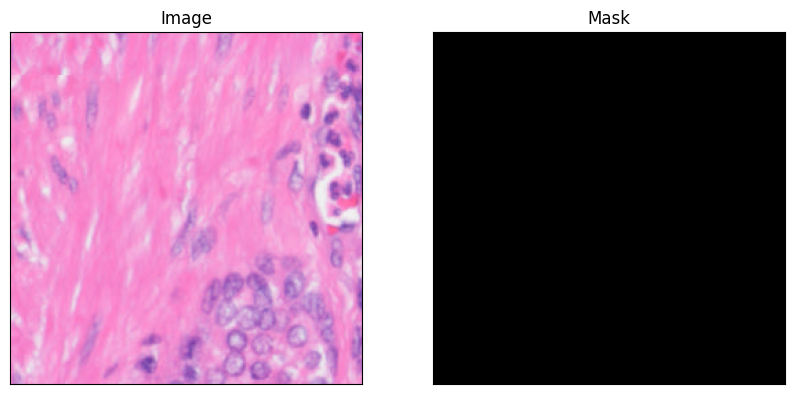

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

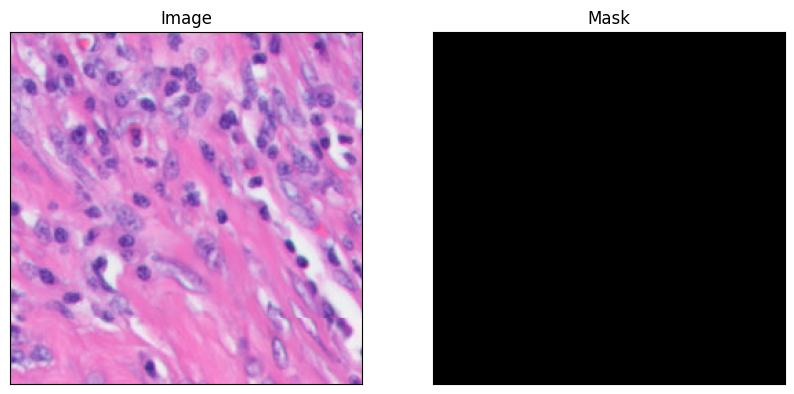

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

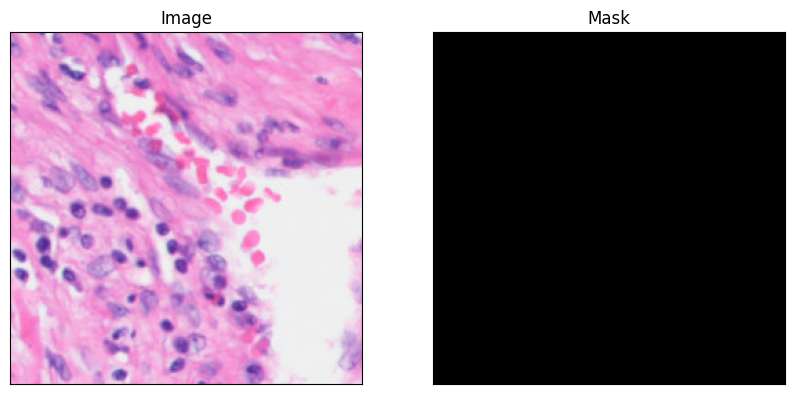

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

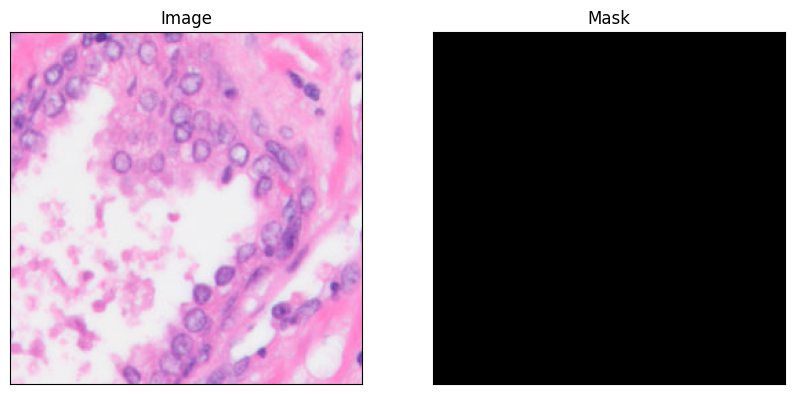

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

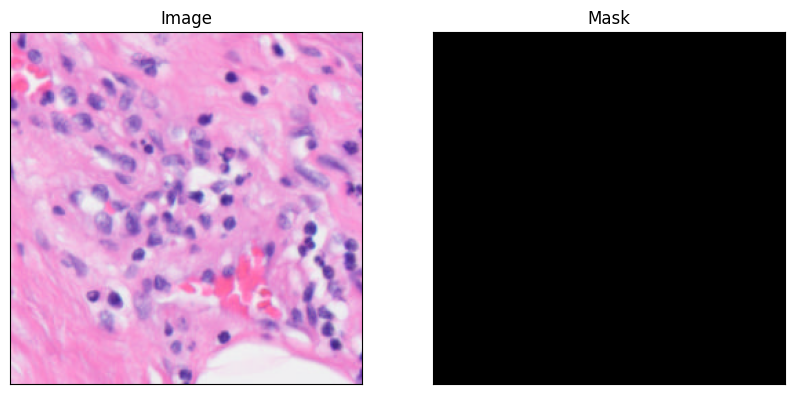

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

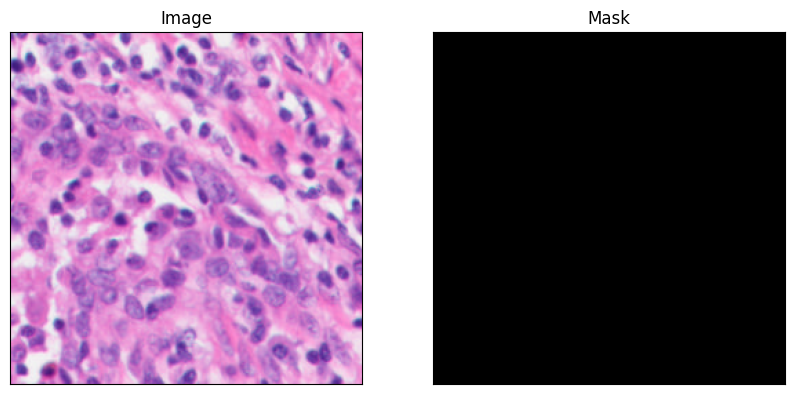

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

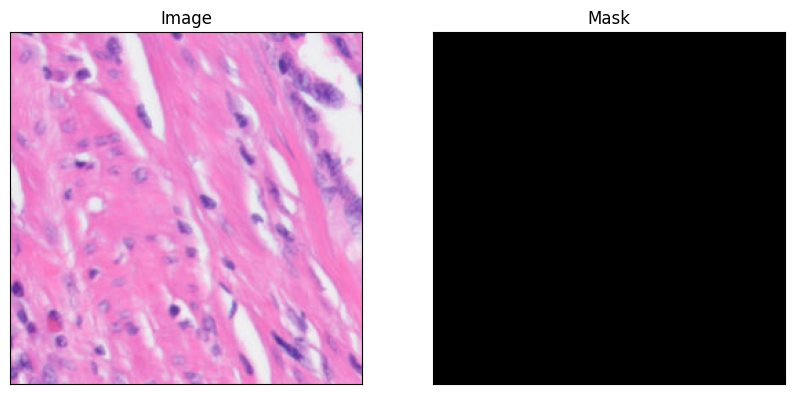

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

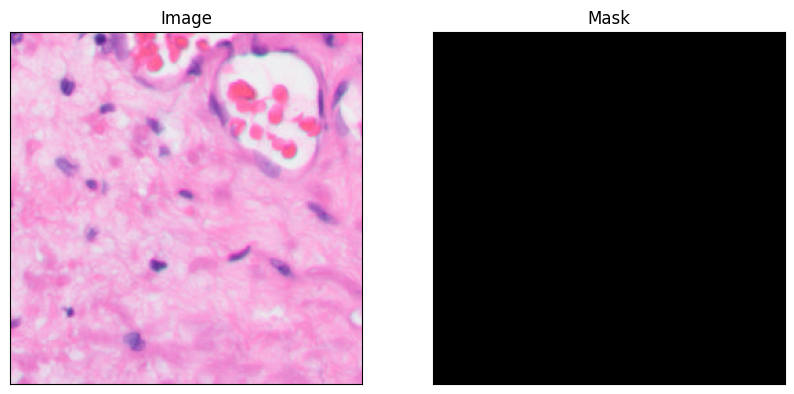

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

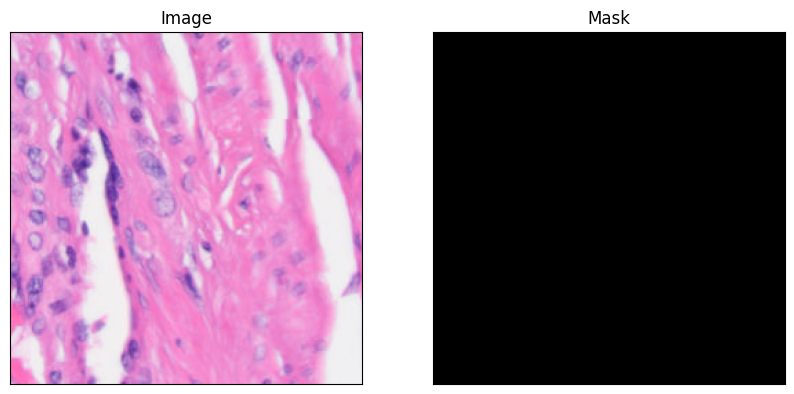

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

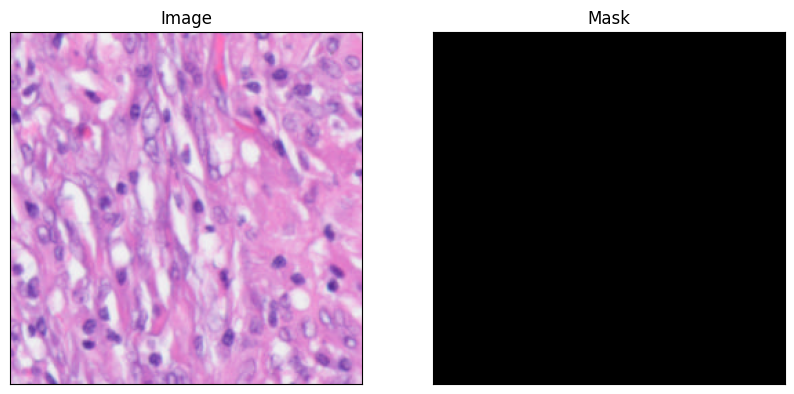

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

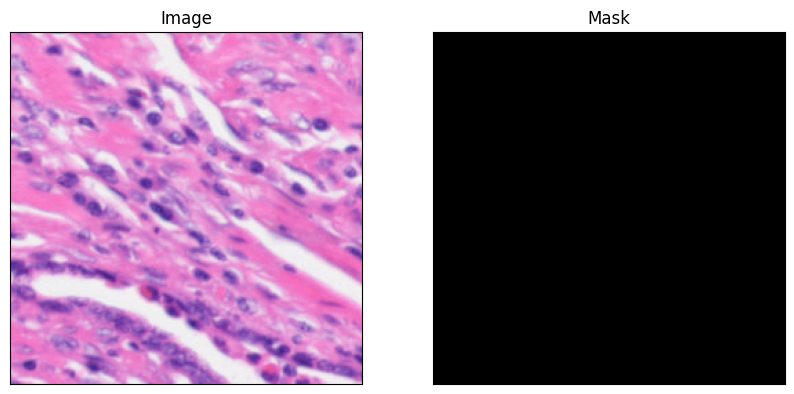

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

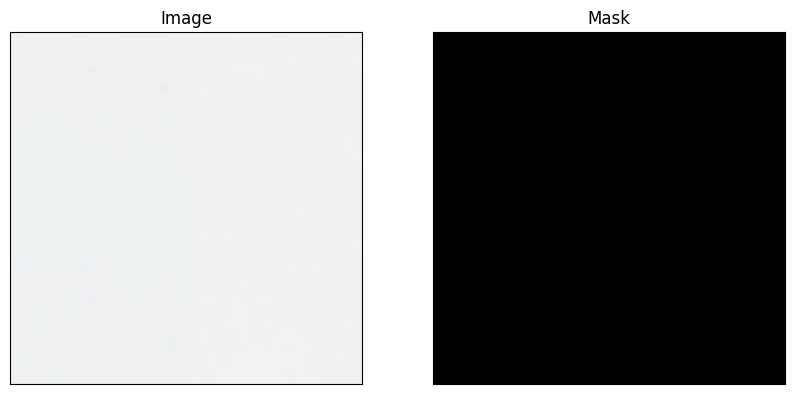

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

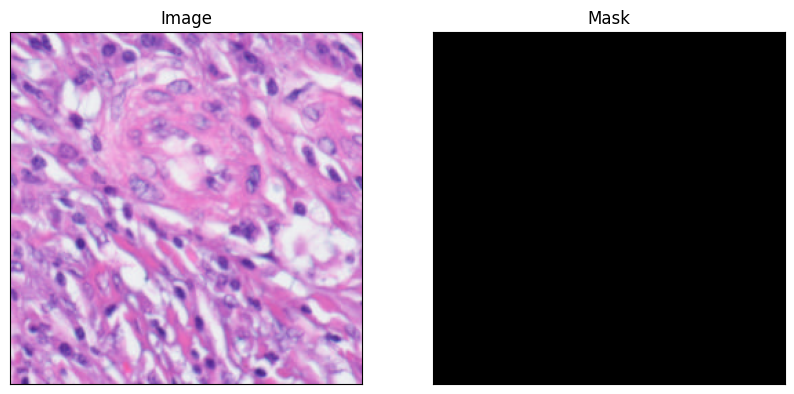

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

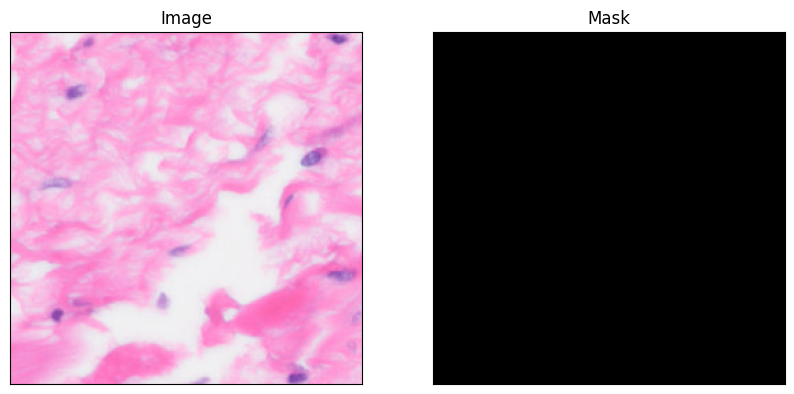

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

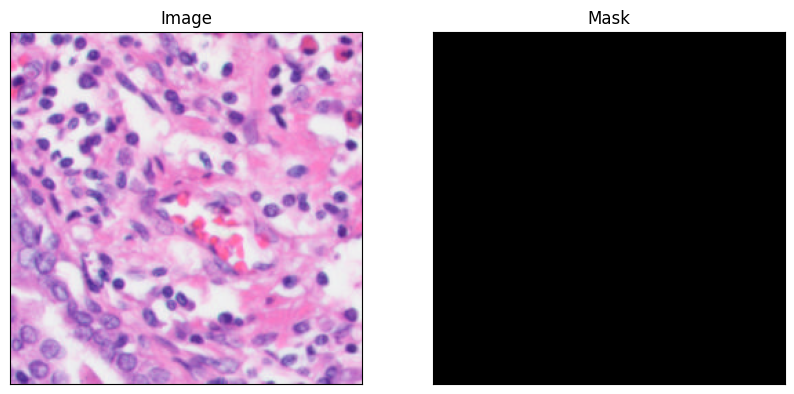

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

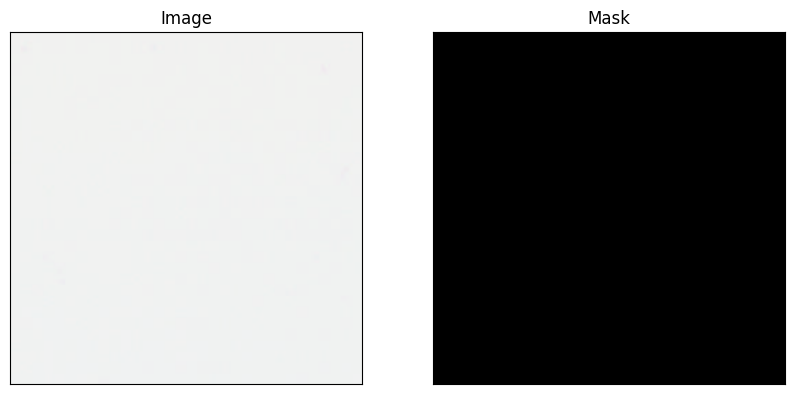

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

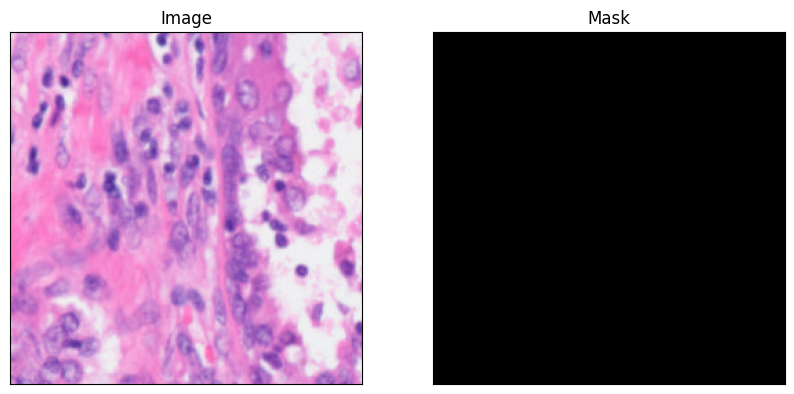

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

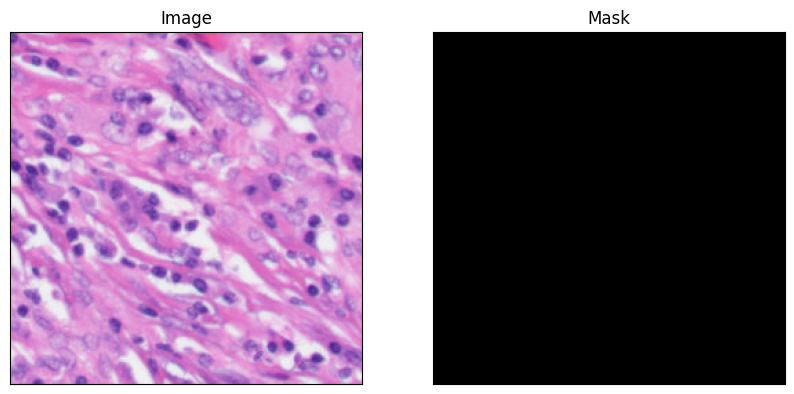

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

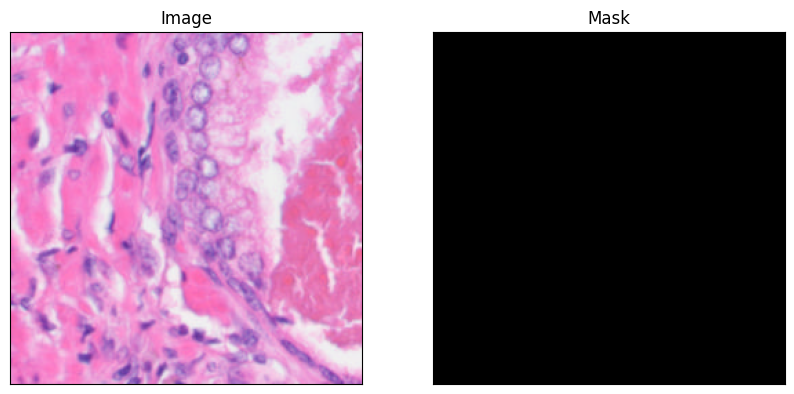

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

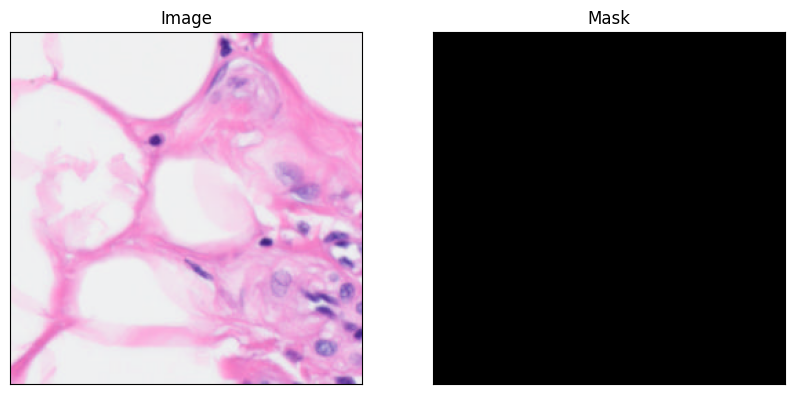

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

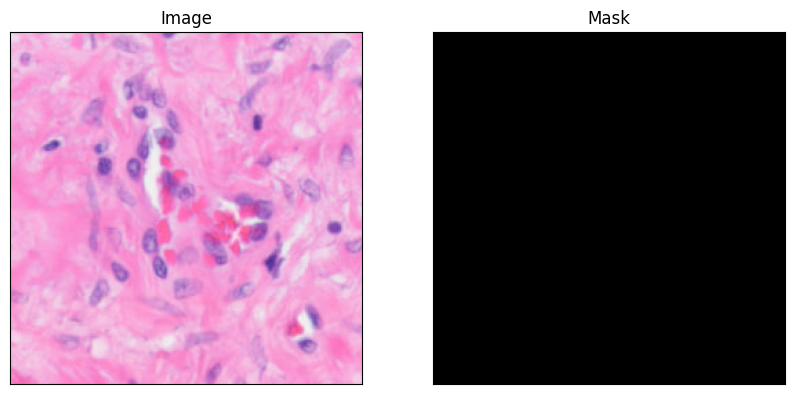

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

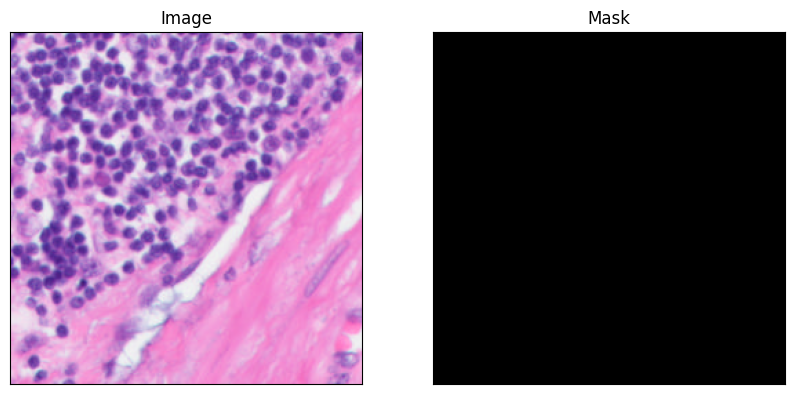

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

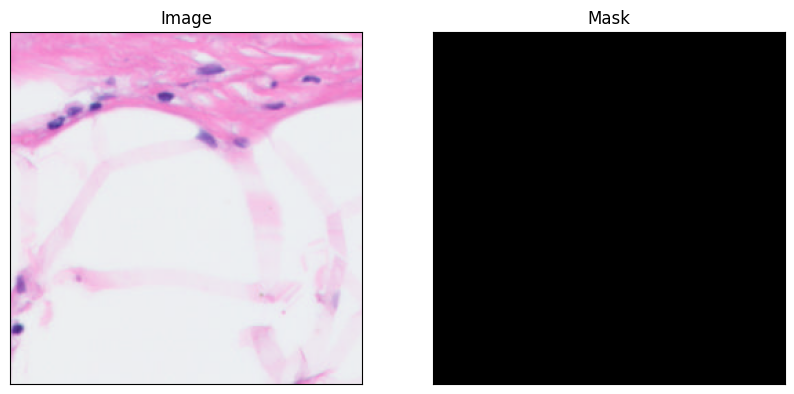

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

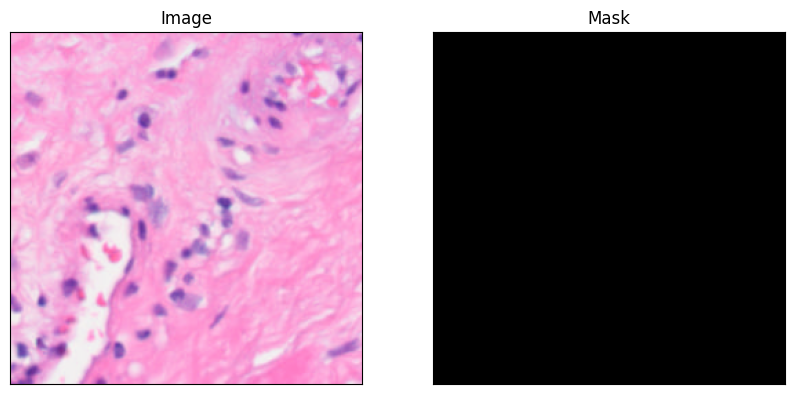

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

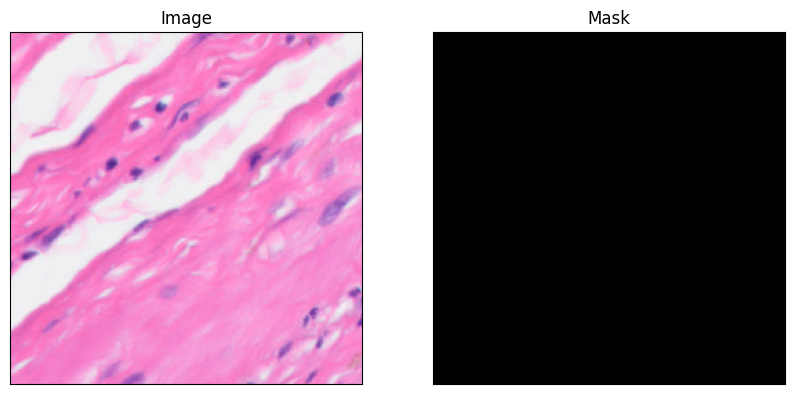

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

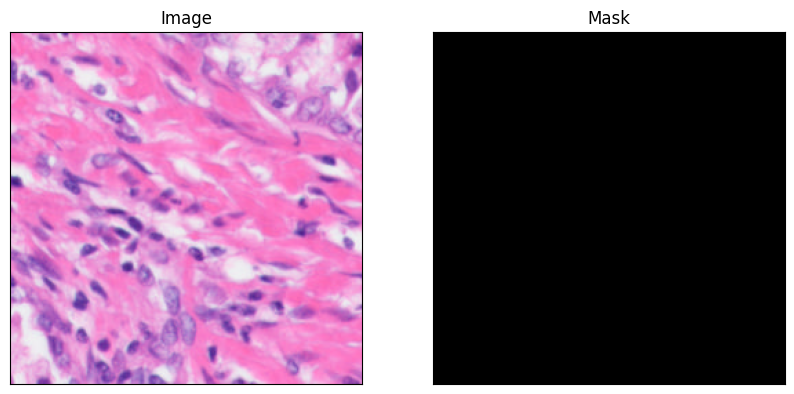

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

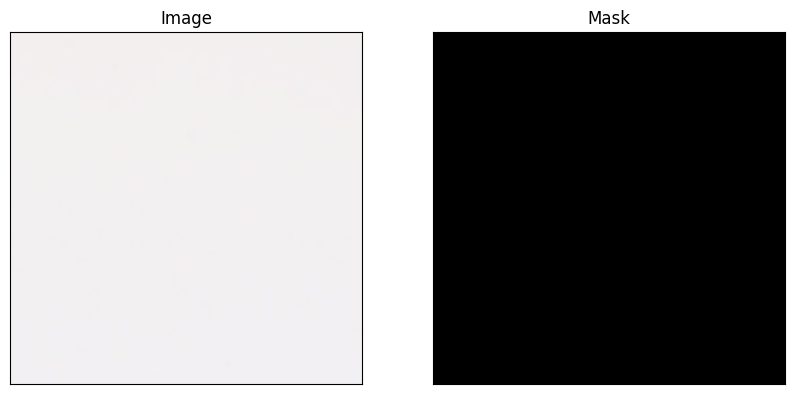

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

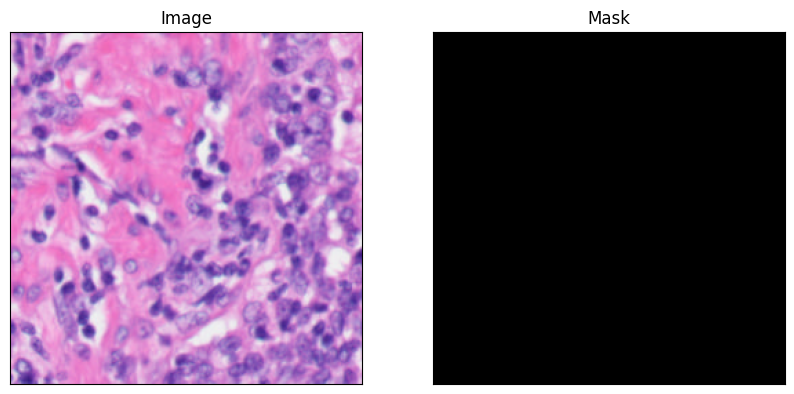

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

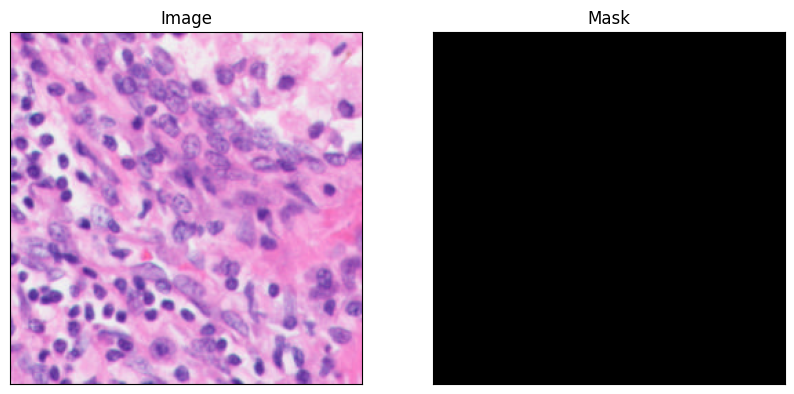

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

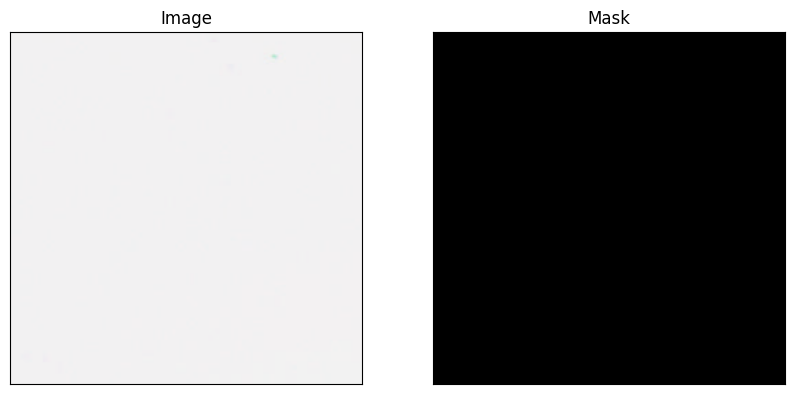

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

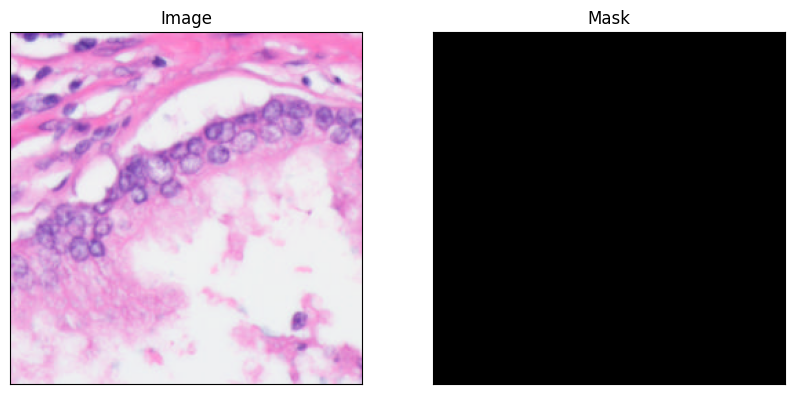

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

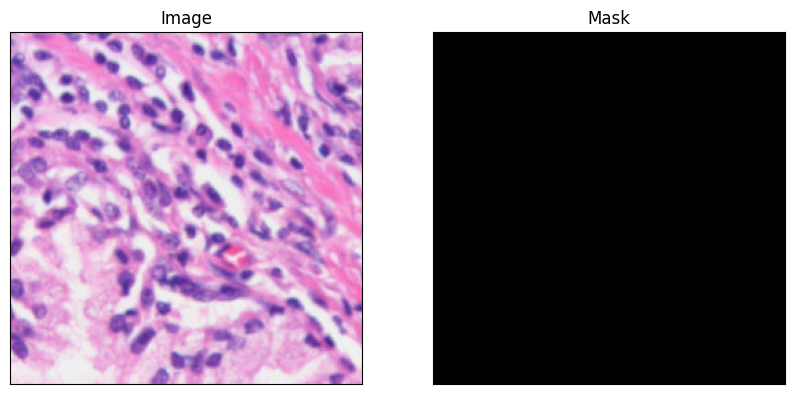

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

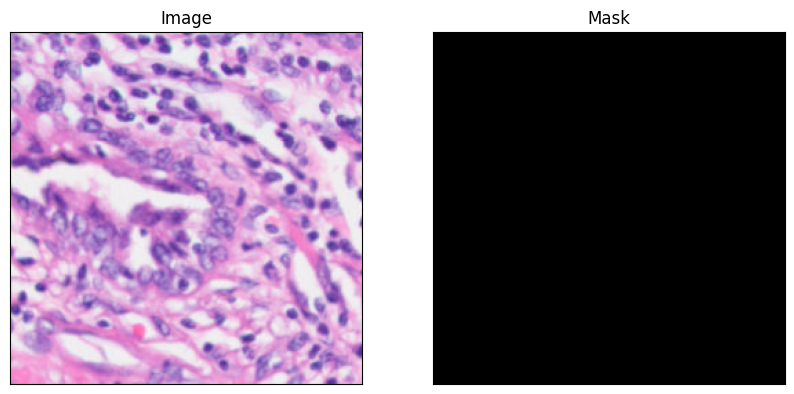

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

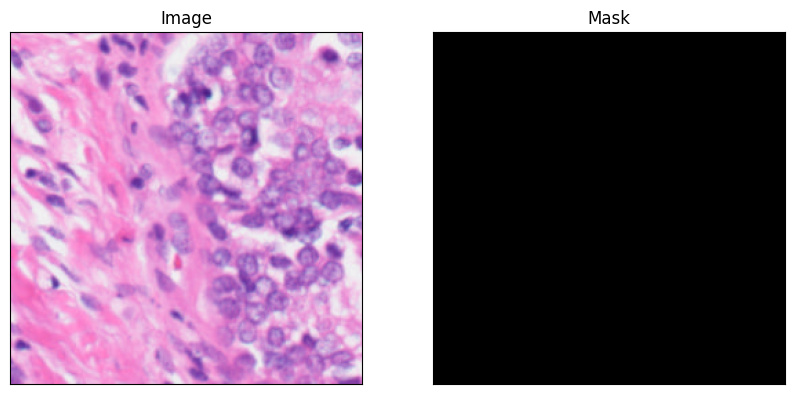

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

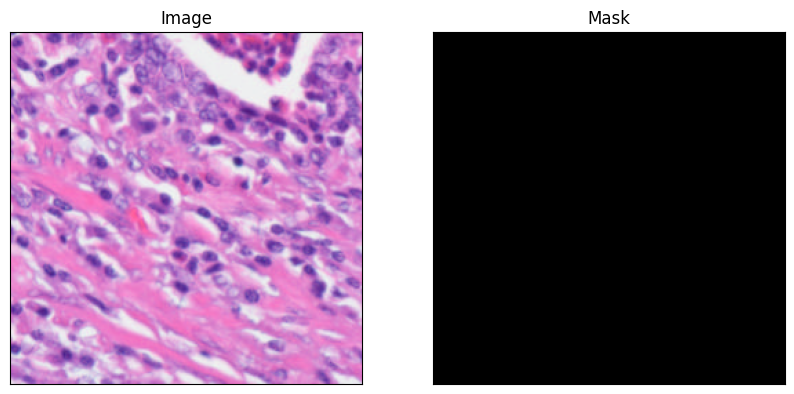

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

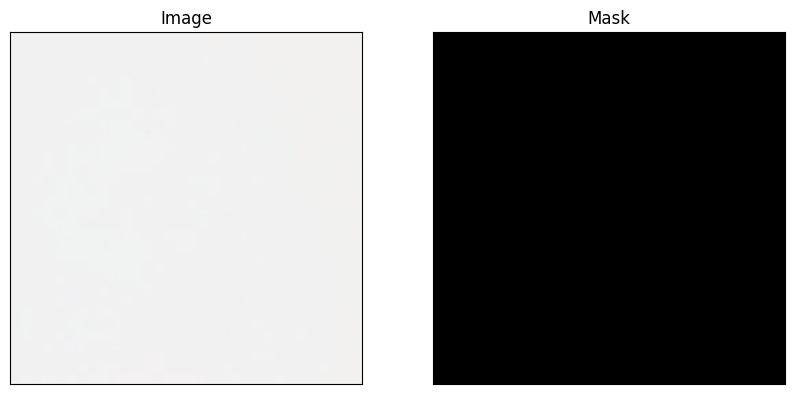

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

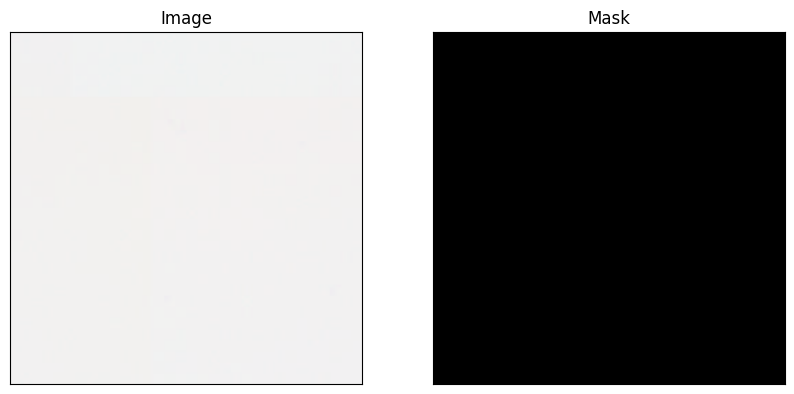

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

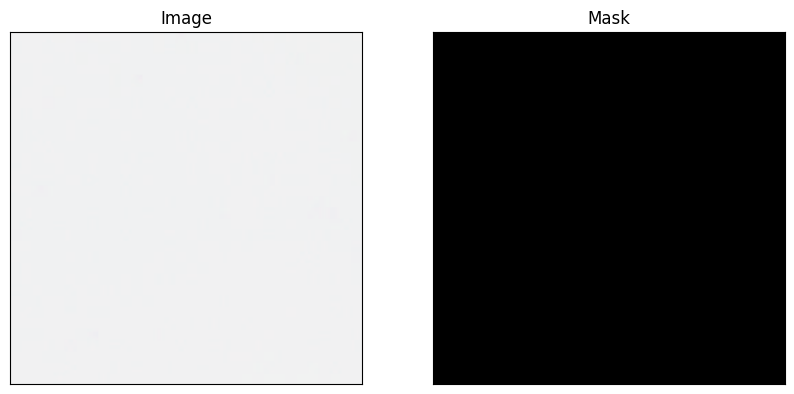

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

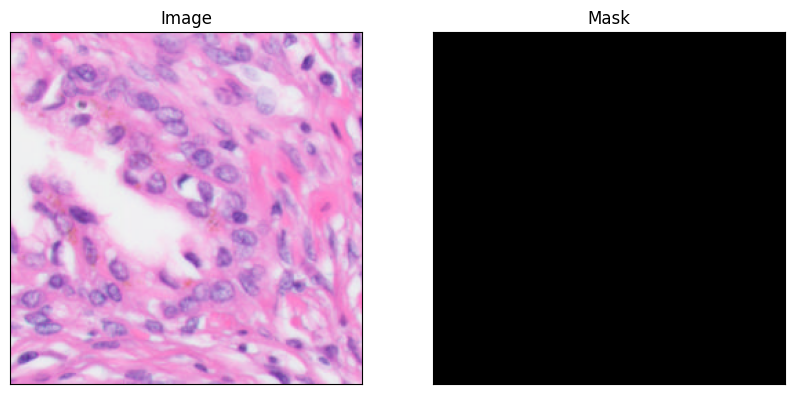

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

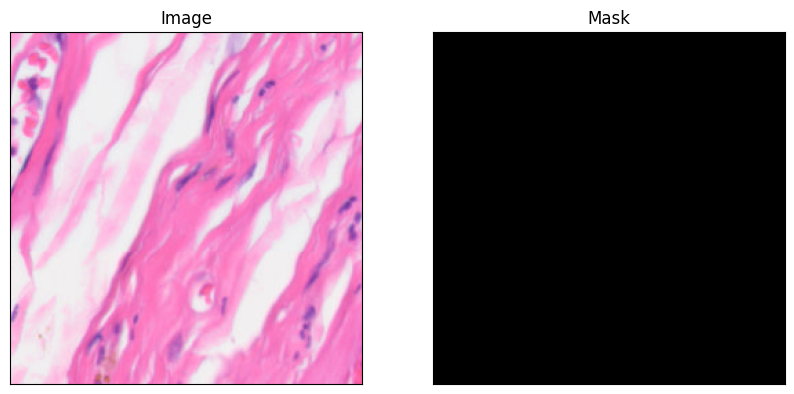

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

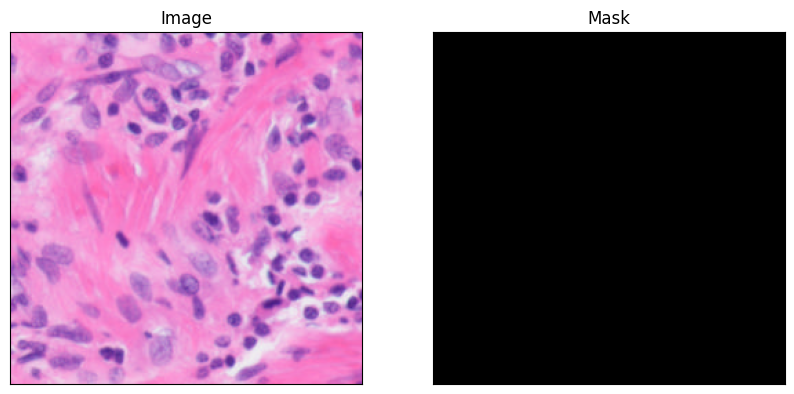

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

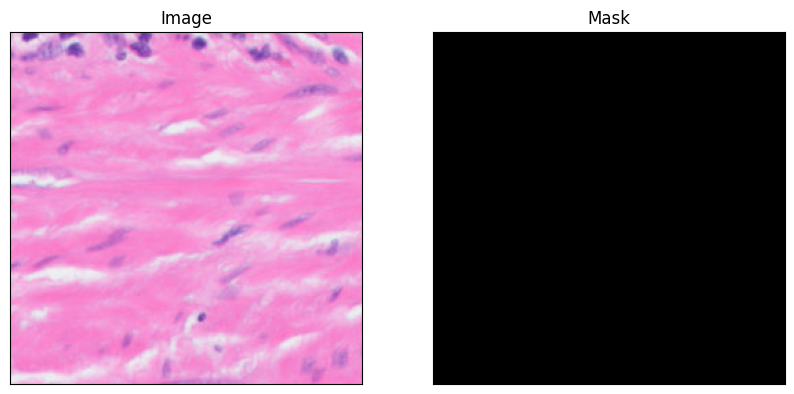

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

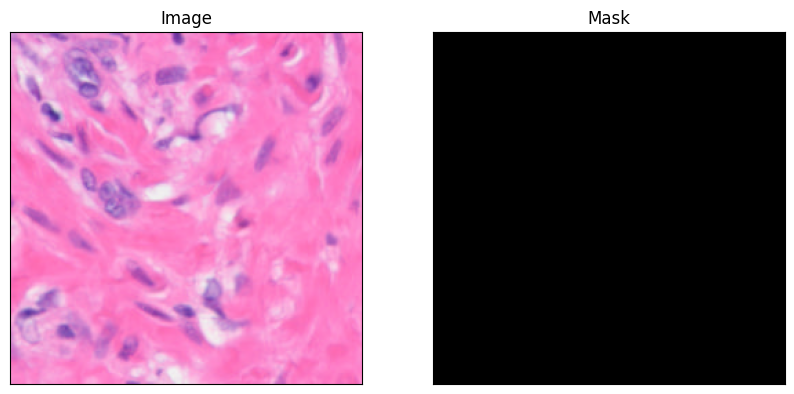

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

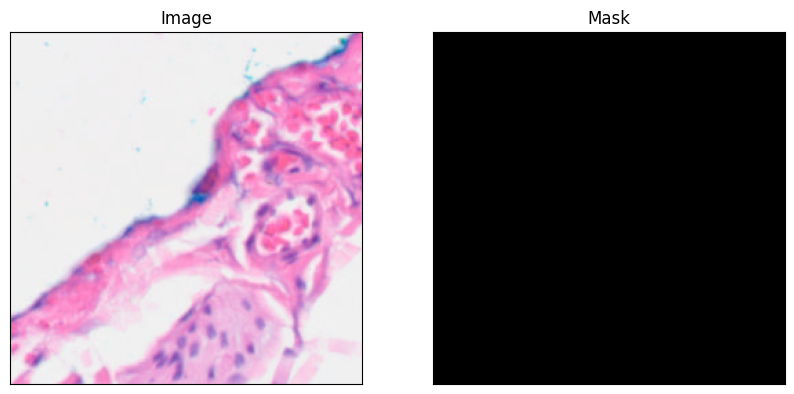

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

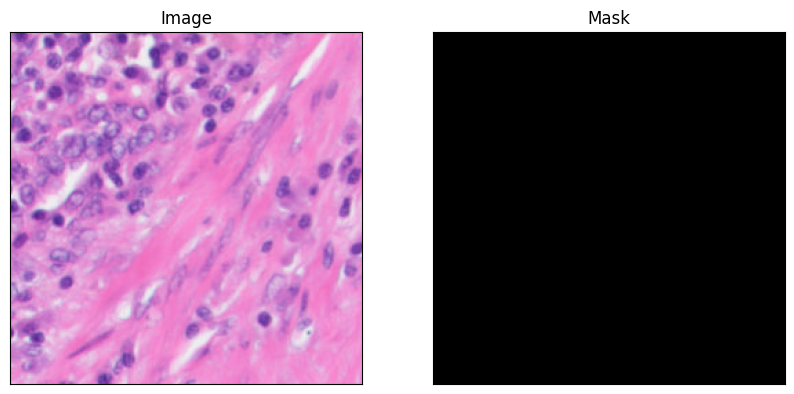

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

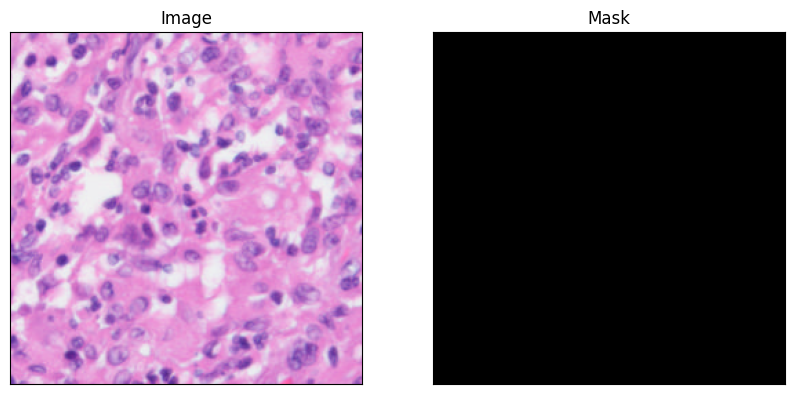

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

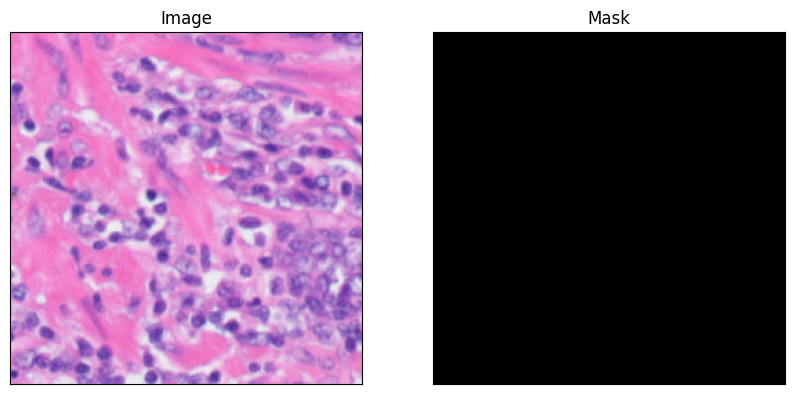

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

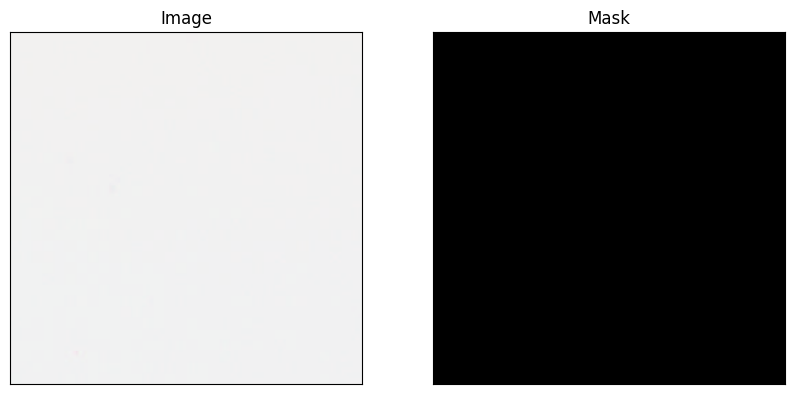

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

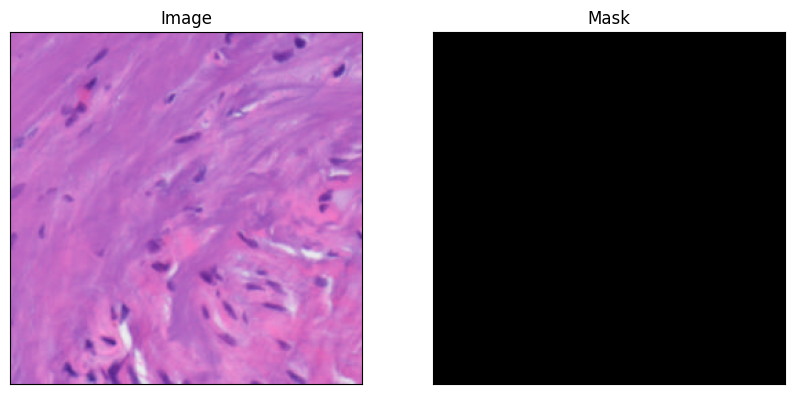

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

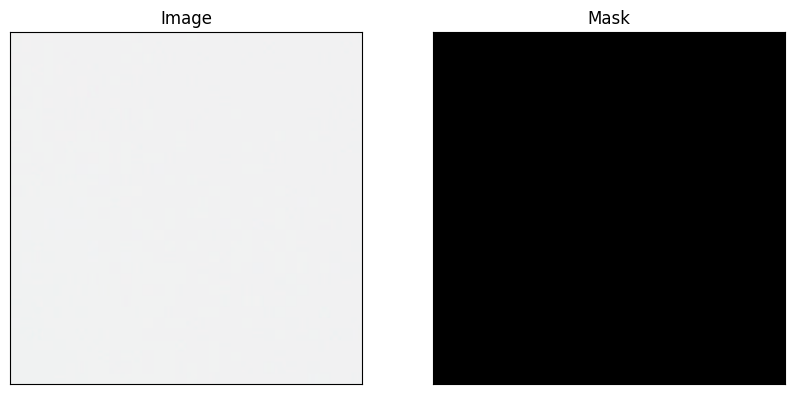

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

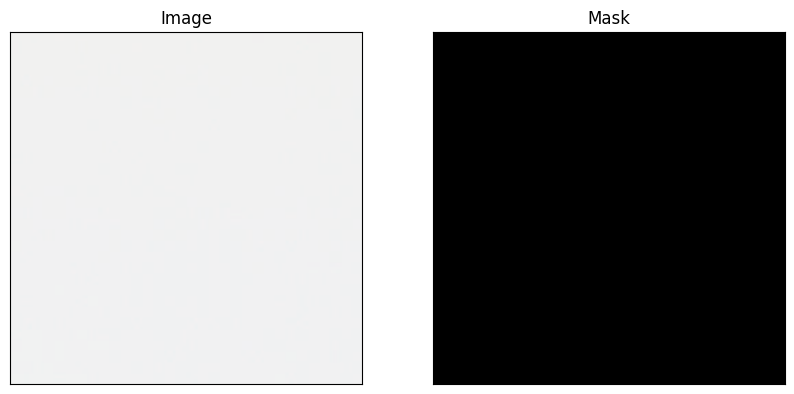

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

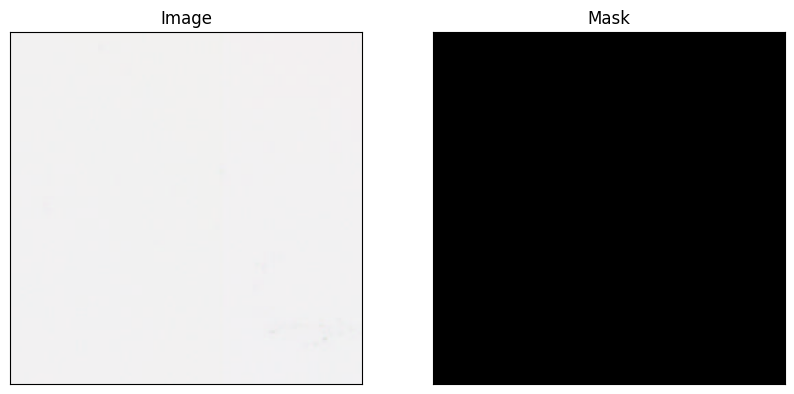

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

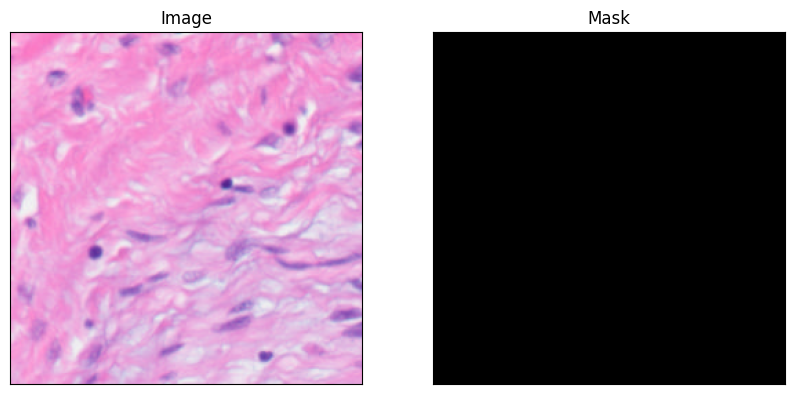

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

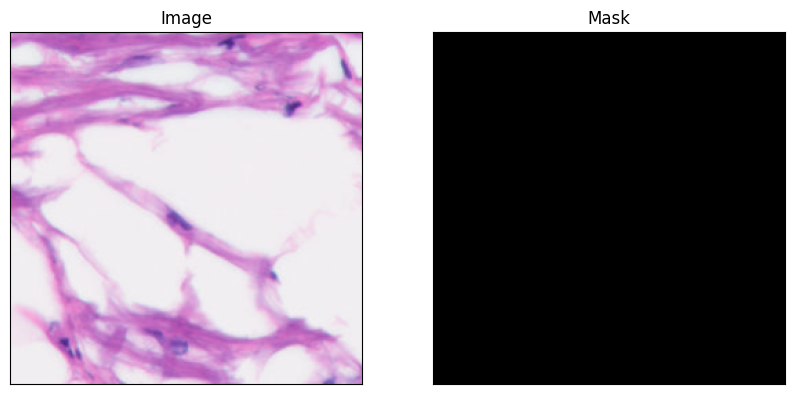

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

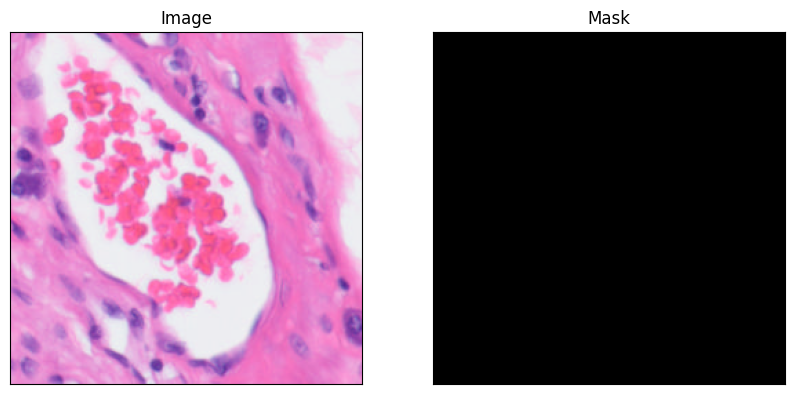

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

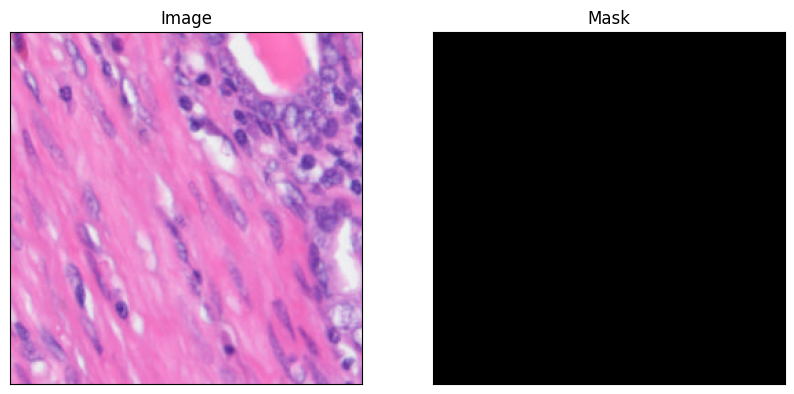

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

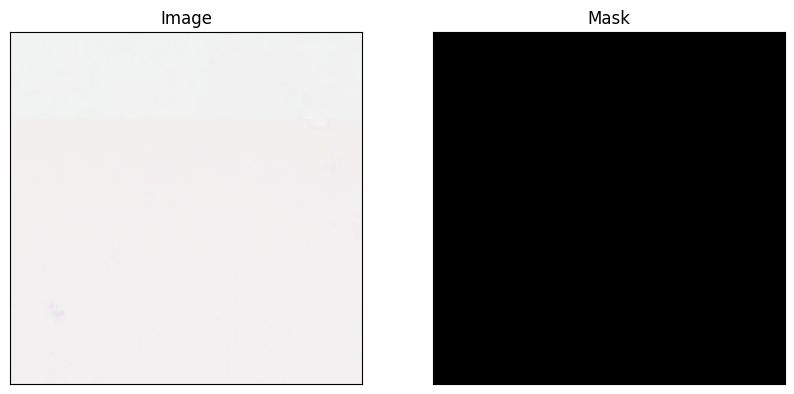

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

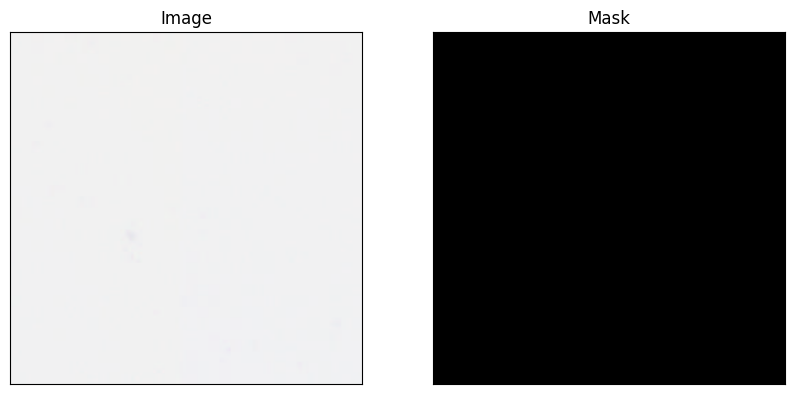

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

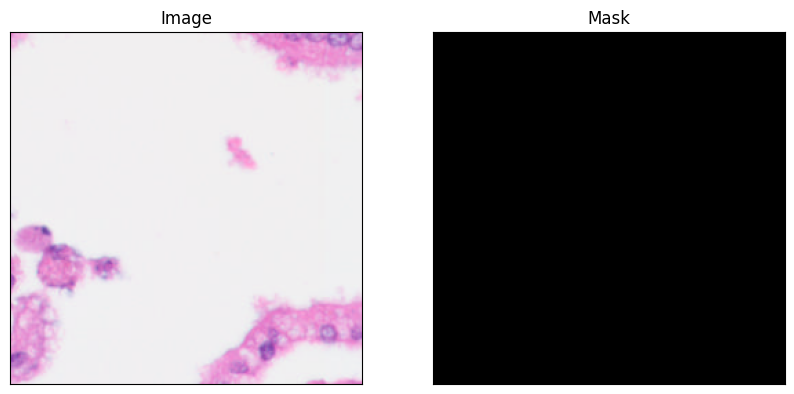

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

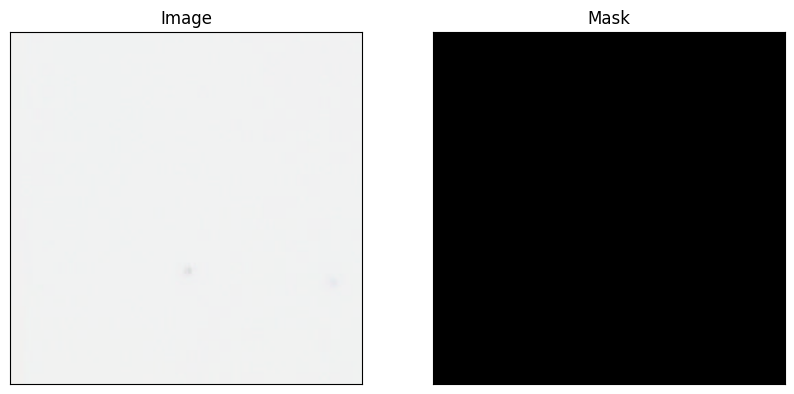

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

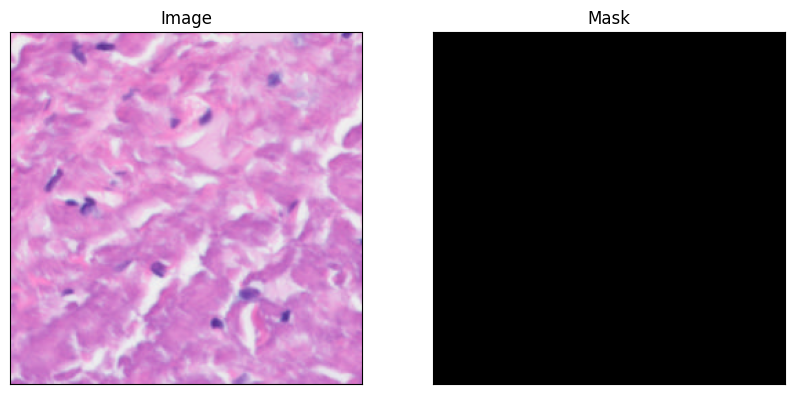

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

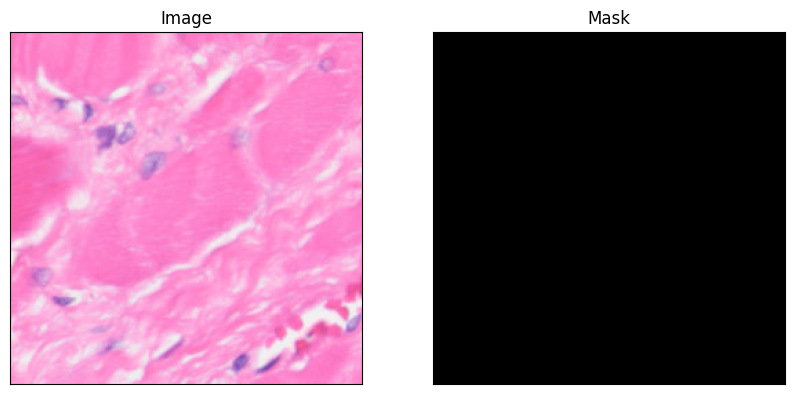

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

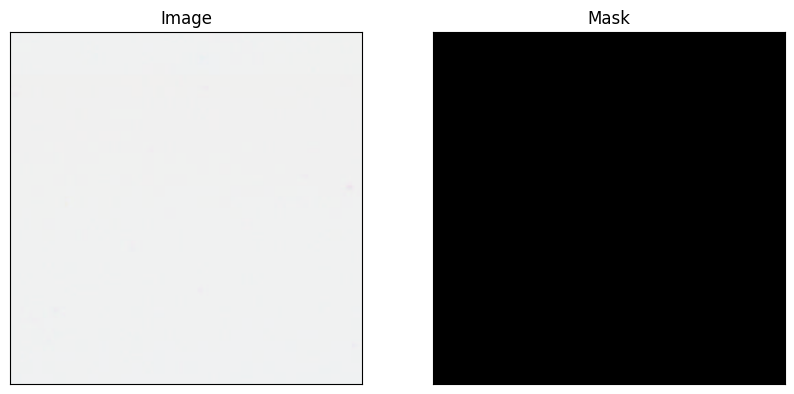

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

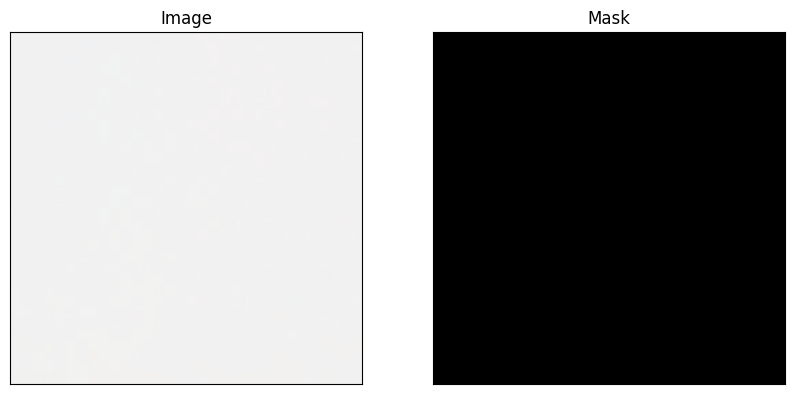

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

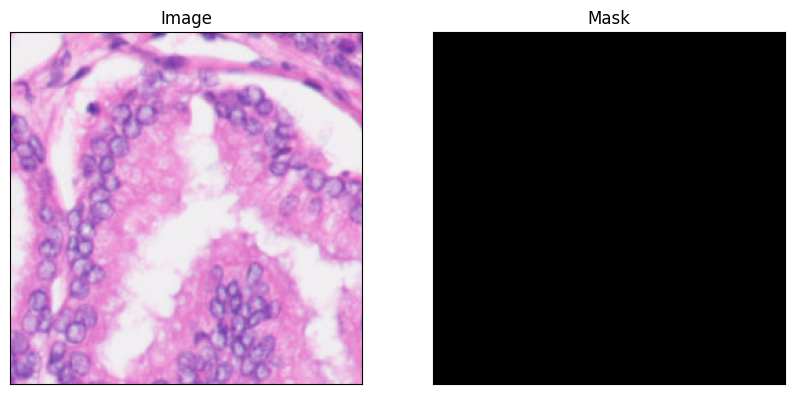

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

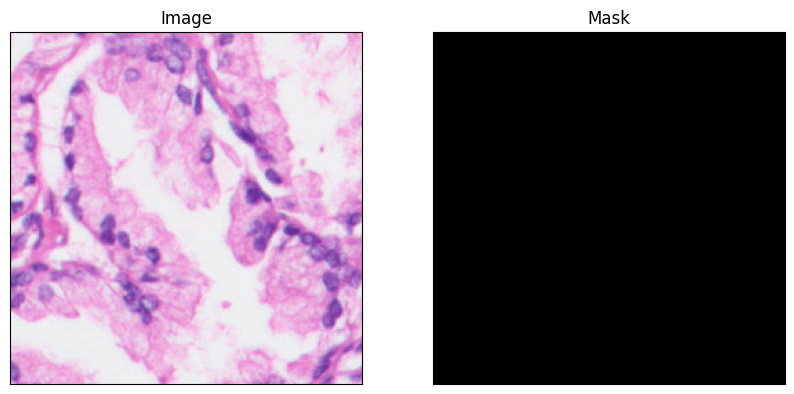

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

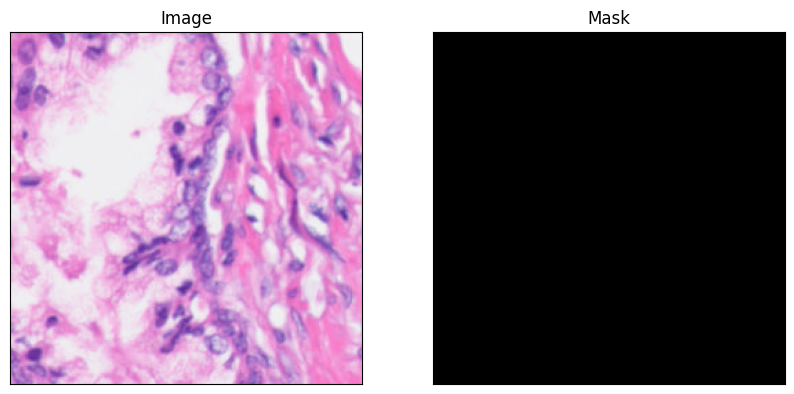

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

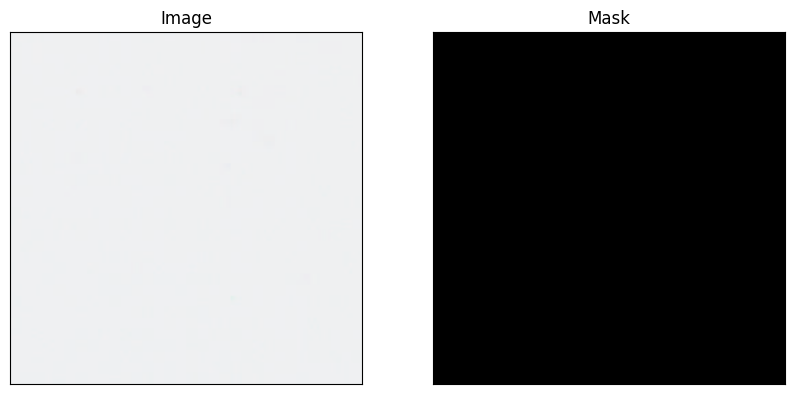

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

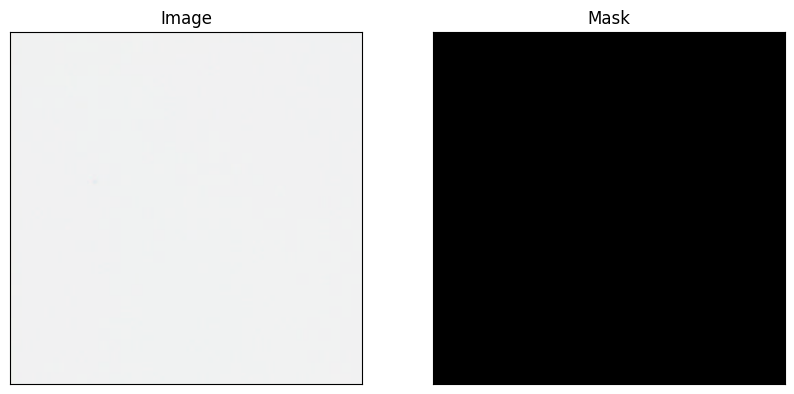

In [ ]:
# Choose a random index from the dataset
img_num = random.randint(0, len(image_files) - 1)  # Use the length of image_files or dataset['image']
example_image = dataset[img_num]["image"]
example_mask = dataset[img_num]["label"]

# Plotting the images
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Plot the first image on the left
axes[0].imshow(np.array(example_image), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[0].set_title("Image")

# Plot the second image (mask) on the right
axes[1].imshow(np.array(example_mask), cmap='gray')  # Convert PIL Image to NumPy array and assume it's grayscale
axes[1].set_title("Mask")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

In [ ]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

ModuleNotFoundError: No module named 'transformers'

In [ ]:
from transformers import SamModel, SamConfig, SamProcessor
import torch

c:\Users\Nishith\miniconda3\envs\ANKITRAJSH2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
import torch

print("Number of GPU: ", torch.cuda.device_count())
print("GPU Name: ", torch.cuda.get_device_name())

Number of GPU:  1
GPU Name:  NVIDIA GeForce RTX 3060 Ti


In [ ]:
# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

# Create an instance of the model architecture with the loaded configuration
my_mito_model = SamModel(config=model_config)
#Update the model by loading the weights from saved file.
my_mito_model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))

<>:8: SyntaxWarning: invalid escape sequence '\s'
<>:8: SyntaxWarning: invalid escape sequence '\s'
<ipython-input-3-3a198ffb6c6e>:8: SyntaxWarning: invalid escape sequence '\s'
  my_mito_model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))
<ipython-input-3-3a198ffb6c6e>:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_o

<All keys matched successfully>

In [ ]:
# set the device to cuda if available, otherwise use cpu
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'filtered_images' is not defined

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

: 

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'filtered_images' is not defined

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# Assuming dataset is already loaded as per your previous code snippet

# let's take a random training example
idx = random.randint(0, len(dataset['image'])-1)

# load image
test_image = dataset['image'][idx]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset['label'][idx])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image in the middle
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the probability map on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'dataset' is not defined

In [ ]:
import numpy as np
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import SamProcessor

# Initialize the processor and load the model if not already loaded
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.eval()
my_mito_model.to(device)

# Let's take a random training example
idx = random.randint(0, len(train_dataset)-1)

# Fetch a sample from the dataset
sample = train_dataset[idx]
test_image = sample["image"]
ground_truth_mask = sample["ground_truth_mask"]

# Get bounding box based on ground truth segmentation map
prompt = train_dataset.get_bounding_box(ground_truth_mask)

# Prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

# Forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# Apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# Convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image (mask) in the middle
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the mask image is grayscale
axes[1].set_title("Mask")

# Plot the probability map on the right
axes[2].imshow(medsam_seg_prob)  # Displaying the probability map
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'train_dataset' is not defined

In [ ]:
from transformers import SamModel, SamConfig, SamProcessor
import torch



import torch

print("Number of GPU: ", torch.cuda.device_count())
print("GPU Name: ", torch.cuda.get_device_name())



# Load the model configuration
model_config = SamConfig.from_pretrained("facebook/sam-vit-base")
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

# Create an instance of the model architecture with the loaded configuration
my_mito_model = SamModel(config=model_config)
#Update the model by loading the weights from saved file.
my_mito_model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))

<>:20: SyntaxWarning: invalid escape sequence '\s'
<>:20: SyntaxWarning: invalid escape sequence '\s'
<ipython-input-10-20b0be3d0feb>:20: SyntaxWarning: invalid escape sequence '\s'
  my_mito_model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))


Number of GPU:  1
GPU Name:  NVIDIA GeForce RTX 3060 Ti


<ipython-input-10-20b0be3d0feb>:20: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  my_mito_model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))


<All keys matched successfully>

In [ ]:
import numpy as np
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import SamProcessor

# Initialize the processor and load the model if not already loaded
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.eval()
my_mito_model.to(device)

# Let's take a random training example
idx = random.randint(0, len(train_dataset)-1)

# Fetch a sample from the dataset
sample = train_dataset[idx]
test_image = sample["image"]
ground_truth_mask = sample["ground_truth_mask"]

# Get bounding box based on ground truth segmentation map
prompt = train_dataset.get_bounding_box(ground_truth_mask)

# Prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

# Forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# Apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# Convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image (mask) in the middle
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the mask image is grayscale
axes[1].set_title("Mask")

# Plot the probability map on the right
axes[2].imshow(medsam_seg_prob)  # Displaying the probability map
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'train_dataset' is not defined

In [ ]:
# Initialize the processor
from transformers import SamProcessor
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")




train_dataset = SAMDataset(dataset=dataset, processor=processor)

NameError: name 'SAMDataset' is not defined

In [ ]:
import numpy as np
from torch.utils.data import Dataset

class SAMDataset(Dataset):
    """
    This class is used to create a dataset that serves input images and masks.
    It takes a dataset and a processor as input and overrides the __len__ and __getitem__ methods of the Dataset class.
    """
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        item = self.dataset[idx]
        image = item["image"]
        ground_truth_mask = np.array(item["label"])
        prompt = self.get_bounding_box(ground_truth_mask)

        # Even if bounding box is default (empty), still process and return structured data
        inputs = self.processor(image, input_boxes=[[prompt]], return_tensors="pt")
        inputs = {k: v.squeeze(0) for k, v in inputs.items()}
        inputs["ground_truth_mask"] = ground_truth_mask
        return inputs


    def get_bounding_box(self, ground_truth_map):
        y_indices, x_indices = np.where(ground_truth_map > 0)
        if y_indices.size == 0 or x_indices.size == 0:
            # Return a default bounding box that indicates an empty or invalid box
            return [0, 0, 1, 1]  # Small, non-zero area at the origin
      

        # Compute bounding box coordinates
        x_min, x_max = np.min(x_indices), np.max(x_indices)
        y_min, y_max = np.min(y_indices), np.max(y_indices)

        # Add random perturbation to bounding box coordinates
        H, W = ground_truth_map.shape
        x_min = max(0, x_min - np.random.randint(0, 20))
        x_max = min(W, x_max + np.random.randint(0, 20))
        y_min = max(0, y_min - np.random.randint(0, 20))
        y_max = min(H, y_max + np.random.randint(0, 20))

        return [x_min, y_min, x_max, y_max]

In [ ]:
train_dataset = SAMDataset(dataset=dataset, processor=processor)

NameError: name 'dataset' is not defined

In [ ]:
import numpy as np
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import SamProcessor

# Initialize the processor and load the model if not already loaded
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.eval()
my_mito_model.to(device)

# Let's take a random training example
idx = random.randint(0, len(train_dataset)-1)

# Fetch a sample from the dataset
sample = train_dataset[idx]
test_image = sample["image"]
ground_truth_mask = sample["ground_truth_mask"]

# Get bounding box based on ground truth segmentation map
prompt = train_dataset.get_bounding_box(ground_truth_mask)

# Prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

# Forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# Apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# Convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image (mask) in the middle
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the mask image is grayscale
axes[1].set_title("Mask")

# Plot the probability map on the right
axes[2].imshow(medsam_seg_prob)  # Displaying the probability map
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'train_dataset' is not defined

In [ ]:
import numpy as np
import random
import torch
from PIL import Image
import matplotlib.pyplot as plt
from transformers import SamProcessor

# Initialize the processor and load the model if not already loaded
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.eval()
my_mito_model.to(device)

# Let's take a random training example
idx = random.randint(0, len(train_dataset)-1)

# Fetch a sample from the dataset
sample = train_dataset[idx]
test_image = sample["image"]
ground_truth_mask = sample["ground_truth_mask"]

# Get bounding box based on ground truth segmentation map
prompt = train_dataset.get_bounding_box(ground_truth_mask)

# Prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

# Forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# Apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# Convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image (mask) in the middle
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the mask image is grayscale
axes[1].set_title("Mask")

# Plot the probability map on the right
axes[2].imshow(medsam_seg_prob)  # Displaying the probability map
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'train_dataset' is not defined

In [ ]:
# Initialize the processor and load the model if not already loaded
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")
device = "cuda" if torch.cuda.is_available() else "cpu"
my_mito_model.eval()
my_mito_model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

In [ ]:
idx = random.randint(0, len(train_dataset)-1)

NameError: name 'train_dataset' is not defined

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=10, sh

SyntaxError: incomplete input (<ipython-input-19-f85ed8f2d17f>, line 1)

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)

NameError: name 'DataLoader' is not defined

In [ ]:
from torch.utils.data import DataLoader

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)

NameError: name 'train_dataset' is not defined

In [ ]:
train_dataloader = DataLoader(train_dataset, batch_size=2, shuffle=True, drop_last=False)

NameError: name 'train_dataset' is not defined

In [ ]:
example = train_dataset[0]

NameError: name 'train_dataset' is not defined

In [ ]:
train_dataset = SAMDataset(dataset=dataset, processor=processor)

NameError: name 'dataset' is not defined

In [ ]:
from datasets import Dataset

In [ ]:
train_dataset = SAMDataset(dataset=dataset, processor=processor)

NameError: name 'dataset' is not defined

In [ ]:
dataset

NameError: name 'dataset' is not defined

In [ ]:
dataset = Dataset.from_dict(dataset_dict)

NameError: name 'dataset_dict' is not defined

In [ ]:
import torch
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader
from torchvision.models.segmentation import fcn_resnet50  # Assuming a similar architecture was used

# Define your model (should be the same as used for training)
def get_model():
    model = fcn_resnet50(pretrained=False, num_classes=your_num_classes)
    return model

# Load the trained model weights
model = get_model()
model.load_state_dict(torch.load('G:\sernetdata\model_checkpoint.pth'))
model.eval()

# Prepare your dataset
class TestDataset(torch.utils.data.Dataset):
    def __init__(self, image_paths, transform=None):
        self.image_paths = image_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_path = self.image_paths[idx]
        image = Image.open(image_path)  # Use PIL to open the image
        image = image.convert('RGB')  # Convert to RGB if necessary
        if self.transform:
            image = self.transform(image)  # Apply transformations
        return image

# Define transformations
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),  # Converts PIL image to a tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Example values
])

# Create your dataset
test_dataset = TestDataset(['"G:\sernetdata\AGGC2022_train\Processed5\Images\patch_65_275_Subset1_Train_1.tiff"'], transform=transform)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

# Inference
with torch.no_grad():
    for images in test_loader:
        outputs = model(images)
        predictions = outputs['out'].argmax(dim=1)  # Get the predicted classes for each pixel

<>:14: SyntaxWarning: invalid escape sequence '\s'
<>:42: SyntaxWarning: invalid escape sequence '\s'
<>:14: SyntaxWarning: invalid escape sequence '\s'
<>:42: SyntaxWarning: invalid escape sequence '\s'
<ipython-input-31-48789e1a939c>:14: SyntaxWarning: invalid escape sequence '\s'
  model.load_state_dict(torch.load('G:\sernetdata\model_checkpoint.pth'))
<ipython-input-31-48789e1a939c>:42: SyntaxWarning: invalid escape sequence '\s'
  test_dataset = TestDataset(['"G:\sernetdata\AGGC2022_train\Processed5\Images\patch_65_275_Subset1_Train_1.tiff"'], transform=transform)
<ipython-input-31-48789e1a939c>:14: SyntaxWarning: invalid escape sequence '\s'
  model.load_state_dict(torch.load('G:\sernetdata\model_checkpoint.pth'))
<ipython-input-31-48789e1a939c>:42: SyntaxWarning: invalid escape sequence '\s'
  test_dataset = TestDataset(['"G:\sernetdata\AGGC2022_train\Processed5\Images\patch_65_275_Subset1_Train_1.tiff"'], transform=transform)


NameError: name 'your_num_classes' is not defined

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# Assuming your model class is defined somewhere as MyModel
class MyModel(torch.nn.Module):
    def __init__(self):
        super(MyModel, self).__init__()
        # Define your model architecture here
        pass

    def forward(self, x):
        # Define the forward pass
        pass

# Initialize the model
model = MyModel()

# Load the trained weights
model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))
model.eval()  # Set the model to evaluation mode

# Assuming you're using CUDA if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Preprocessing steps (make sure this matches your training preprocessing)
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize to the same size as during training
    transforms.ToTensor(),          # Convert to tensor
    # Normalize using the same mean and std as during training
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Load and preprocess a new image
new_image = Image.open('path_to_new_image.jpg').convert('RGB')
new_image = transform(new_image).unsqueeze(0)  # Add batch dimension
new_image = new_image.to(device)

# Perform segmentation
with torch.no_grad():
    output = model(new_image)
    # Assuming the output is a segmentation mask
    predicted_mask = torch.sigmoid(output).data.cpu().numpy()

# Assuming single output channel for binary segmentation, threshold to create a binary mask
predicted_mask = (predicted_mask > 0.5).astype(np.uint8)

# Display the results
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(np.array(Image.open("G:\sernetdata\AGGC2022_train\Processed5\Images\patch_65_282_Subset1_Train_1.tiff")))
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(predicted_mask[0, 0], cmap='gray')  # Indexing depends on your model output shape
plt.title('Segmentation Mask')
plt.axis('off')

plt.show()

<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:54: SyntaxWarning: invalid escape sequence '\s'
<>:22: SyntaxWarning: invalid escape sequence '\s'
<>:54: SyntaxWarning: invalid escape sequence '\s'
<ipython-input-32-7d4da16b19b3>:22: SyntaxWarning: invalid escape sequence '\s'
  model.load_state_dict(torch.load("G:\sernetdata\model_checkpoint.pth"))
<ipython-input-32-7d4da16b19b3>:54: SyntaxWarning: invalid escape sequence '\s'
  plt.imshow(np.array(Image.open("G:\sernetdata\AGGC2022_train\Processed5\Images\patch_65_282_Subset1_Train_1.tiff")))
<ipython-input-32-7d4da16b19b3>:22: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` wil

RuntimeError: Error(s) in loading state_dict for MyModel:
	Unexpected key(s) in state_dict: "shared_image_embedding.positional_embedding", "vision_encoder.pos_embed", "vision_encoder.patch_embed.projection.weight", "vision_encoder.patch_embed.projection.bias", "vision_encoder.layers.0.layer_norm1.weight", "vision_encoder.layers.0.layer_norm1.bias", "vision_encoder.layers.0.attn.rel_pos_h", "vision_encoder.layers.0.attn.rel_pos_w", "vision_encoder.layers.0.attn.qkv.weight", "vision_encoder.layers.0.attn.qkv.bias", "vision_encoder.layers.0.attn.proj.weight", "vision_encoder.layers.0.attn.proj.bias", "vision_encoder.layers.0.layer_norm2.weight", "vision_encoder.layers.0.layer_norm2.bias", "vision_encoder.layers.0.mlp.lin1.weight", "vision_encoder.layers.0.mlp.lin1.bias", "vision_encoder.layers.0.mlp.lin2.weight", "vision_encoder.layers.0.mlp.lin2.bias", "vision_encoder.layers.1.layer_norm1.weight", "vision_encoder.layers.1.layer_norm1.bias", "vision_encoder.layers.1.attn.rel_pos_h", "vision_encoder.layers.1.attn.rel_pos_w", "vision_encoder.layers.1.attn.qkv.weight", "vision_encoder.layers.1.attn.qkv.bias", "vision_encoder.layers.1.attn.proj.weight", "vision_encoder.layers.1.attn.proj.bias", "vision_encoder.layers.1.layer_norm2.weight", "vision_encoder.layers.1.layer_norm2.bias", "vision_encoder.layers.1.mlp.lin1.weight", "vision_encoder.layers.1.mlp.lin1.bias", "vision_encoder.layers.1.mlp.lin2.weight", "vision_encoder.layers.1.mlp.lin2.bias", "vision_encoder.layers.2.layer_norm1.weight", "vision_encoder.layers.2.layer_norm1.bias", "vision_encoder.layers.2.attn.rel_pos_h", "vision_encoder.layers.2.attn.rel_pos_w", "vision_encoder.layers.2.attn.qkv.weight", "vision_encoder.layers.2.attn.qkv.bias", "vision_encoder.layers.2.attn.proj.weight", "vision_encoder.layers.2.attn.proj.bias", "vision_encoder.layers.2.layer_norm2.weight", "vision_encoder.layers.2.layer_norm2.bias", "vision_encoder.layers.2.mlp.lin1.weight", "vision_encoder.layers.2.mlp.lin1.bias", "vision_encoder.layers.2.mlp.lin2.weight", "vision_encoder.layers.2.mlp.lin2.bias", "vision_encoder.layers.3.layer_norm1.weight", "vision_encoder.layers.3.layer_norm1.bias", "vision_encoder.layers.3.attn.rel_pos_h", "vision_encoder.layers.3.attn.rel_pos_w", "vision_encoder.layers.3.attn.qkv.weight", "vision_encoder.layers.3.attn.qkv.bias", "vision_encoder.layers.3.attn.proj.weight", "vision_encoder.layers.3.attn.proj.bias", "vision_encoder.layers.3.layer_norm2.weight", "vision_encoder.layers.3.layer_norm2.bias", "vision_encoder.layers.3.mlp.lin1.weight", "vision_encoder.layers.3.mlp.lin1.bias", "vision_encoder.layers.3.mlp.lin2.weight", "vision_encoder.layers.3.mlp.lin2.bias", "vision_encoder.layers.4.layer_norm1.weight", "vision_encoder.layers.4.layer_norm1.bias", "vision_encoder.layers.4.attn.rel_pos_h", "vision_encoder.layers.4.attn.rel_pos_w", "vision_encoder.layers.4.attn.qkv.weight", "vision_encoder.layers.4.attn.qkv.bias", "vision_encoder.layers.4.attn.proj.weight", "vision_encoder.layers.4.attn.proj.bias", "vision_encoder.layers.4.layer_norm2.weight", "vision_encoder.layers.4.layer_norm2.bias", "vision_encoder.layers.4.mlp.lin1.weight", "vision_encoder.layers.4.mlp.lin1.bias", "vision_encoder.layers.4.mlp.lin2.weight", "vision_encoder.layers.4.mlp.lin2.bias", "vision_encoder.layers.5.layer_norm1.weight", "vision_encoder.layers.5.layer_norm1.bias", "vision_encoder.layers.5.attn.rel_pos_h", "vision_encoder.layers.5.attn.rel_pos_w", "vision_encoder.layers.5.attn.qkv.weight", "vision_encoder.layers.5.attn.qkv.bias", "vision_encoder.layers.5.attn.proj.weight", "vision_encoder.layers.5.attn.proj.bias", "vision_encoder.layers.5.layer_norm2.weight", "vision_encoder.layers.5.layer_norm2.bias", "vision_encoder.layers.5.mlp.lin1.weight", "vision_encoder.layers.5.mlp.lin1.bias", "vision_encoder.layers.5.mlp.lin2.weight", "vision_encoder.layers.5.mlp.lin2.bias", "vision_encoder.layers.6.layer_norm1.weight", "vision_encoder.layers.6.layer_norm1.bias", "vision_encoder.layers.6.attn.rel_pos_h", "vision_encoder.layers.6.attn.rel_pos_w", "vision_encoder.layers.6.attn.qkv.weight", "vision_encoder.layers.6.attn.qkv.bias", "vision_encoder.layers.6.attn.proj.weight", "vision_encoder.layers.6.attn.proj.bias", "vision_encoder.layers.6.layer_norm2.weight", "vision_encoder.layers.6.layer_norm2.bias", "vision_encoder.layers.6.mlp.lin1.weight", "vision_encoder.layers.6.mlp.lin1.bias", "vision_encoder.layers.6.mlp.lin2.weight", "vision_encoder.layers.6.mlp.lin2.bias", "vision_encoder.layers.7.layer_norm1.weight", "vision_encoder.layers.7.layer_norm1.bias", "vision_encoder.layers.7.attn.rel_pos_h", "vision_encoder.layers.7.attn.rel_pos_w", "vision_encoder.layers.7.attn.qkv.weight", "vision_encoder.layers.7.attn.qkv.bias", "vision_encoder.layers.7.attn.proj.weight", "vision_encoder.layers.7.attn.proj.bias", "vision_encoder.layers.7.layer_norm2.weight", "vision_encoder.layers.7.layer_norm2.bias", "vision_encoder.layers.7.mlp.lin1.weight", "vision_encoder.layers.7.mlp.lin1.bias", "vision_encoder.layers.7.mlp.lin2.weight", "vision_encoder.layers.7.mlp.lin2.bias", "vision_encoder.layers.8.layer_norm1.weight", "vision_encoder.layers.8.layer_norm1.bias", "vision_encoder.layers.8.attn.rel_pos_h", "vision_encoder.layers.8.attn.rel_pos_w", "vision_encoder.layers.8.attn.qkv.weight", "vision_encoder.layers.8.attn.qkv.bias", "vision_encoder.layers.8.attn.proj.weight", "vision_encoder.layers.8.attn.proj.bias", "vision_encoder.layers.8.layer_norm2.weight", "vision_encoder.layers.8.layer_norm2.bias", "vision_encoder.layers.8.mlp.lin1.weight", "vision_encoder.layers.8.mlp.lin1.bias", "vision_encoder.layers.8.mlp.lin2.weight", "vision_encoder.layers.8.mlp.lin2.bias", "vision_encoder.layers.9.layer_norm1.weight", "vision_encoder.layers.9.layer_norm1.bias", "vision_encoder.layers.9.attn.rel_pos_h", "vision_encoder.layers.9.attn.rel_pos_w", "vision_encoder.layers.9.attn.qkv.weight", "vision_encoder.layers.9.attn.qkv.bias", "vision_encoder.layers.9.attn.proj.weight", "vision_encoder.layers.9.attn.proj.bias", "vision_encoder.layers.9.layer_norm2.weight", "vision_encoder.layers.9.layer_norm2.bias", "vision_encoder.layers.9.mlp.lin1.weight", "vision_encoder.layers.9.mlp.lin1.bias", "vision_encoder.layers.9.mlp.lin2.weight", "vision_encoder.layers.9.mlp.lin2.bias", "vision_encoder.layers.10.layer_norm1.weight", "vision_encoder.layers.10.layer_norm1.bias", "vision_encoder.layers.10.attn.rel_pos_h", "vision_encoder.layers.10.attn.rel_pos_w", "vision_encoder.layers.10.attn.qkv.weight", "vision_encoder.layers.10.attn.qkv.bias", "vision_encoder.layers.10.attn.proj.weight", "vision_encoder.layers.10.attn.proj.bias", "vision_encoder.layers.10.layer_norm2.weight", "vision_encoder.layers.10.layer_norm2.bias", "vision_encoder.layers.10.mlp.lin1.weight", "vision_encoder.layers.10.mlp.lin1.bias", "vision_encoder.layers.10.mlp.lin2.weight", "vision_encoder.layers.10.mlp.lin2.bias", "vision_encoder.layers.11.layer_norm1.weight", "vision_encoder.layers.11.layer_norm1.bias", "vision_encoder.layers.11.attn.rel_pos_h", "vision_encoder.layers.11.attn.rel_pos_w", "vision_encoder.layers.11.attn.qkv.weight", "vision_encoder.layers.11.attn.qkv.bias", "vision_encoder.layers.11.attn.proj.weight", "vision_encoder.layers.11.attn.proj.bias", "vision_encoder.layers.11.layer_norm2.weight", "vision_encoder.layers.11.layer_norm2.bias", "vision_encoder.layers.11.mlp.lin1.weight", "vision_encoder.layers.11.mlp.lin1.bias", "vision_encoder.layers.11.mlp.lin2.weight", "vision_encoder.layers.11.mlp.lin2.bias", "vision_encoder.neck.conv1.weight", "vision_encoder.neck.layer_norm1.weight", "vision_encoder.neck.layer_norm1.bias", "vision_encoder.neck.conv2.weight", "vision_encoder.neck.layer_norm2.weight", "vision_encoder.neck.layer_norm2.bias", "prompt_encoder.shared_embedding.positional_embedding", "prompt_encoder.mask_embed.conv1.weight", "prompt_encoder.mask_embed.conv1.bias", "prompt_encoder.mask_embed.conv2.weight", "prompt_encoder.mask_embed.conv2.bias", "prompt_encoder.mask_embed.conv3.weight", "prompt_encoder.mask_embed.conv3.bias", "prompt_encoder.mask_embed.layer_norm1.weight", "prompt_encoder.mask_embed.layer_norm1.bias", "prompt_encoder.mask_embed.layer_norm2.weight", "prompt_encoder.mask_embed.layer_norm2.bias", "prompt_encoder.no_mask_embed.weight", "prompt_encoder.point_embed.0.weight", "prompt_encoder.point_embed.1.weight", "prompt_encoder.point_embed.2.weight", "prompt_encoder.point_embed.3.weight", "prompt_encoder.not_a_point_embed.weight", "mask_decoder.iou_token.weight", "mask_decoder.mask_tokens.weight", "mask_decoder.transformer.layers.0.self_attn.q_proj.weight", "mask_decoder.transformer.layers.0.self_attn.q_proj.bias", "mask_decoder.transformer.layers.0.self_attn.k_proj.weight", "mask_decoder.transformer.layers.0.self_attn.k_proj.bias", "mask_decoder.transformer.layers.0.self_attn.v_proj.weight", "mask_decoder.transformer.layers.0.self_attn.v_proj.bias", "mask_decoder.transformer.layers.0.self_attn.out_proj.weight", "mask_decoder.transformer.layers.0.self_attn.out_proj.bias", "mask_decoder.transformer.layers.0.layer_norm1.weight", "mask_decoder.transformer.layers.0.layer_norm1.bias", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.q_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.q_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.k_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.k_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.v_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.v_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.out_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_token_to_image.out_proj.bias", "mask_decoder.transformer.layers.0.layer_norm2.weight", "mask_decoder.transformer.layers.0.layer_norm2.bias", "mask_decoder.transformer.layers.0.mlp.lin1.weight", "mask_decoder.transformer.layers.0.mlp.lin1.bias", "mask_decoder.transformer.layers.0.mlp.lin2.weight", "mask_decoder.transformer.layers.0.mlp.lin2.bias", "mask_decoder.transformer.layers.0.layer_norm3.weight", "mask_decoder.transformer.layers.0.layer_norm3.bias", "mask_decoder.transformer.layers.0.layer_norm4.weight", "mask_decoder.transformer.layers.0.layer_norm4.bias", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.q_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.q_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.k_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.k_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.v_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.v_proj.bias", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.out_proj.weight", "mask_decoder.transformer.layers.0.cross_attn_image_to_token.out_proj.bias", "mask_decoder.transformer.layers.1.self_attn.q_proj.weight", "mask_decoder.transformer.layers.1.self_attn.q_proj.bias", "mask_decoder.transformer.layers.1.self_attn.k_proj.weight", "mask_decoder.transformer.layers.1.self_attn.k_proj.bias", "mask_decoder.transformer.layers.1.self_attn.v_proj.weight", "mask_decoder.transformer.layers.1.self_attn.v_proj.bias", "mask_decoder.transformer.layers.1.self_attn.out_proj.weight", "mask_decoder.transformer.layers.1.self_attn.out_proj.bias", "mask_decoder.transformer.layers.1.layer_norm1.weight", "mask_decoder.transformer.layers.1.layer_norm1.bias", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.q_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.q_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.k_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.k_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.v_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.v_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.out_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_token_to_image.out_proj.bias", "mask_decoder.transformer.layers.1.layer_norm2.weight", "mask_decoder.transformer.layers.1.layer_norm2.bias", "mask_decoder.transformer.layers.1.mlp.lin1.weight", "mask_decoder.transformer.layers.1.mlp.lin1.bias", "mask_decoder.transformer.layers.1.mlp.lin2.weight", "mask_decoder.transformer.layers.1.mlp.lin2.bias", "mask_decoder.transformer.layers.1.layer_norm3.weight", "mask_decoder.transformer.layers.1.layer_norm3.bias", "mask_decoder.transformer.layers.1.layer_norm4.weight", "mask_decoder.transformer.layers.1.layer_norm4.bias", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.q_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.q_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.k_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.k_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.v_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.v_proj.bias", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.out_proj.weight", "mask_decoder.transformer.layers.1.cross_attn_image_to_token.out_proj.bias", "mask_decoder.transformer.final_attn_token_to_image.q_proj.weight", "mask_decoder.transformer.final_attn_token_to_image.q_proj.bias", "mask_decoder.transformer.final_attn_token_to_image.k_proj.weight", "mask_decoder.transformer.final_attn_token_to_image.k_proj.bias", "mask_decoder.transformer.final_attn_token_to_image.v_proj.weight", "mask_decoder.transformer.final_attn_token_to_image.v_proj.bias", "mask_decoder.transformer.final_attn_token_to_image.out_proj.weight", "mask_decoder.transformer.final_attn_token_to_image.out_proj.bias", "mask_decoder.transformer.layer_norm_final_attn.weight", "mask_decoder.transformer.layer_norm_final_attn.bias", "mask_decoder.upscale_conv1.weight", "mask_decoder.upscale_conv1.bias", "mask_decoder.upscale_conv2.weight", "mask_decoder.upscale_conv2.bias", "mask_decoder.upscale_layer_norm.weight", "mask_decoder.upscale_layer_norm.bias", "mask_decoder.output_hypernetworks_mlps.0.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.0.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.0.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.0.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.0.layers.0.weight", "mask_decoder.output_hypernetworks_mlps.0.layers.0.bias", "mask_decoder.output_hypernetworks_mlps.1.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.1.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.1.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.1.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.1.layers.0.weight", "mask_decoder.output_hypernetworks_mlps.1.layers.0.bias", "mask_decoder.output_hypernetworks_mlps.2.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.2.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.2.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.2.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.2.layers.0.weight", "mask_decoder.output_hypernetworks_mlps.2.layers.0.bias", "mask_decoder.output_hypernetworks_mlps.3.proj_in.weight", "mask_decoder.output_hypernetworks_mlps.3.proj_in.bias", "mask_decoder.output_hypernetworks_mlps.3.proj_out.weight", "mask_decoder.output_hypernetworks_mlps.3.proj_out.bias", "mask_decoder.output_hypernetworks_mlps.3.layers.0.weight", "mask_decoder.output_hypernetworks_mlps.3.layers.0.bias", "mask_decoder.iou_prediction_head.proj_in.weight", "mask_decoder.iou_prediction_head.proj_in.bias", "mask_decoder.iou_prediction_head.proj_out.weight", "mask_decoder.iou_prediction_head.proj_out.bias", "mask_decoder.iou_prediction_head.layers.0.weight", "mask_decoder.iou_prediction_head.layers.0.bias". 

In [ ]:
import numpy as np
import random
import torch
import matplotlib.pyplot as plt

# let's take a random training example
idx = random.randint(0, filtered_images.shape[0]-1)

# load image
test_image = dataset[idx]["image"]

# get box prompt based on ground truth segmentation map
ground_truth_mask = np.array(dataset[idx]["label"])
prompt = get_bounding_box(ground_truth_mask)

# prepare image + box prompt for the model
inputs = processor(test_image, input_boxes=[[prompt]], return_tensors="pt")

# Move the input tensor to the GPU if it's not already there
inputs = {k: v.to(device) for k, v in inputs.items()}

my_mito_model.eval()

# forward pass
with torch.no_grad():
    outputs = my_mito_model(**inputs, multimask_output=False)

# apply sigmoid
medsam_seg_prob = torch.sigmoid(outputs.pred_masks.squeeze(1))
# convert soft mask to hard mask
medsam_seg_prob = medsam_seg_prob.cpu().numpy().squeeze()
medsam_seg = (medsam_seg_prob > 0.5).astype(np.uint8)


fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the first image on the left
axes[0].imshow(np.array(test_image), cmap='gray')  # Assuming the first image is grayscale
axes[0].set_title("Image")

# Plot the second image on the right
axes[1].imshow(medsam_seg, cmap='gray')  # Assuming the second image is grayscale
axes[1].set_title("Mask")

# Plot the second image on the right
axes[2].imshow(medsam_seg_prob)  # Assuming the second image is grayscale
axes[2].set_title("Probability Map")

# Hide axis ticks and labels
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])

# Display the images side by side
plt.show()

NameError: name 'filtered_images' is not defined

In [ ]:
import torch
from transformers import SamModel

In [ ]:
# Path to your model file
model_path = "G:/sernetdata/model_checkpoint.pth"

# Load the model
model = SamModel.from_pretrained("facebook/sam-vit-base", state_dict=torch.load(model_path))
model.eval()  # Set the model to evaluation mode

# Define device
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

<ipython-input-35-27586b5fff5c>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = SamModel.from_pretrained("facebook/sam-vit-base", state_dict=torch.load(model_path))

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

In [ ]:
# Define device
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

SamModel(
  (shared_image_embedding): SamPositionalEmbedding()
  (vision_encoder): SamVisionEncoder(
    (patch_embed): SamPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (layers): ModuleList(
      (0-11): 12 x SamVisionLayer(
        (layer_norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): SamVisionAttention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (proj): Linear(in_features=768, out_features=768, bias=True)
        )
        (layer_norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): SamMLPBlock(
          (lin1): Linear(in_features=768, out_features=3072, bias=True)
          (lin2): Linear(in_features=3072, out_features=768, bias=True)
          (act): GELUActivation()
        )
      )
    )
    (neck): SamVisionNeck(
      (conv1): Conv2d(768, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (layer_norm1): SamLayerNorm()
     

In [ ]:
from PIL import Image
from transformers import SamProcessor

In [ ]:
processor = SamProcessor.from_pretrained("facebook/sam-vit-base")

In [ ]:
def prepare_input(image_path):
    image = Image.open(image_path).convert("RGB")
    input_boxes = [[0, 0, image.width, image.height]]  # Assume you want to use the whole image for now
    inputs = processor(images=image, input_boxes=input_boxes, return_tensors="pt")
    return inputs

In [ ]:
def segment_image(image_path):
    inputs = prepare_input(image_path)
    inputs = {k: v.to(device) for k, v in inputs.items()}  # Move inputs to GPU if available

    with torch.no_grad():
        outputs = model(**inputs, multimask_output=False)
    predicted_masks = torch.sigmoid(outputs.pred_masks).squeeze(1)  # Apply sigmoid and remove batch dimension

    return predicted_masks.cpu().numpy()  # Move the mask to CPU and convert to NumPy array

In [ ]:
# Example usage
image_path = "G:\sernetdata\AGGC2022_train\Processed5\Images\patch_66_86_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

<>:2: SyntaxWarning: invalid escape sequence '\s'
<>:2: SyntaxWarning: invalid escape sequence '\s'
<ipython-input-41-d9b9bc039cae>:2: SyntaxWarning: invalid escape sequence '\s'
  image_path = "G:\sernetdata\AGGC2022_train\Processed5\Images\patch_66_86_Subset1_Train_1.tiff"
c:\Users\Nishith\miniconda3\envs\ANKITRAJSH2\Lib\site-packages\transformers\image_processing_utils.py:41: UserWarning: The following named arguments are not valid for `SamImageProcessor.preprocess` and were ignored: 'point_pad_value'
  return self.preprocess(images, **kwargs)
<ipython-input-41-d9b9bc039cae>:2: SyntaxWarning: invalid escape sequence '\s'
  image_path = "G:\sernetdata\AGGC2022_train\Processed5\Images\patch_66_86_Subset1_Train_1.tiff"


ValueError: Input boxes must be a list of list of list of floating points.

In [ ]:
def prepare_input(image_path):
    image = Image.open(image_path).convert("RGB")
    input_boxes = [[[0, 0, image.width, image.height]]]  # Encapsulate in another list
    inputs = processor(images=image, input_boxes=input_boxes, return_tensors="pt")
    return inputs

In [ ]:
def segment_image(image_path):
    inputs = prepare_input(image_path)
    inputs = {k: v.to(device) for k, v in inputs.items()}  # Move inputs to GPU if available

    with torch.no_grad():
        outputs = model(**inputs, multimask_output=False)
    predicted_masks = torch.sigmoid(outputs.pred_masks).squeeze(1)  # Apply sigmoid and remove batch dimension

    return predicted_masks.cpu().numpy()

TypeError: Invalid shape (1, 256, 256) for image data

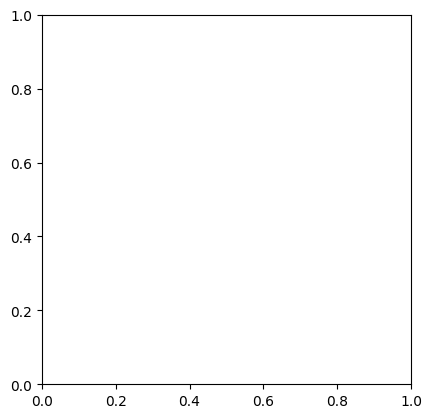

In [ ]:
 # Move the mask to CPU and convert to NumPy array
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_66_86_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt

plt.imshow(predicted_mask[0], cmap='gray')
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

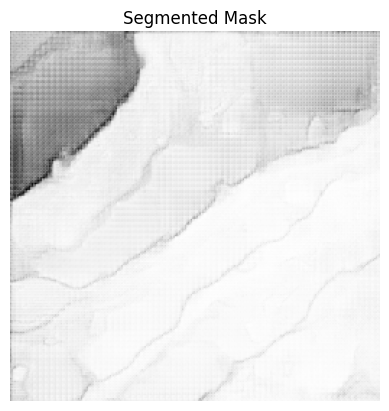

In [ ]:
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_66_86_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt
# Correctly preparing the mask for visualization
plt.imshow(predicted_mask[0].squeeze(), cmap='gray')  # Use .squeeze() to remove the singular dimension
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

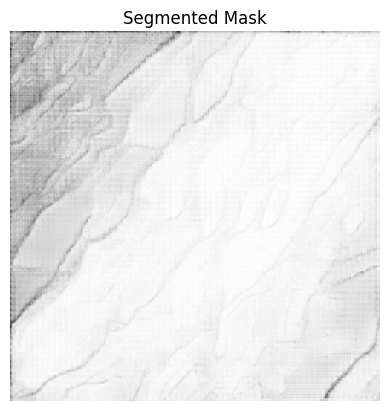

In [ ]:
 # Move the mask to CPU and convert to NumPy array
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_66_89_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt
# Correctly preparing the mask for visualization
plt.imshow(predicted_mask[0].squeeze(), cmap='gray')  # Use .squeeze() to remove the singular dimension
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

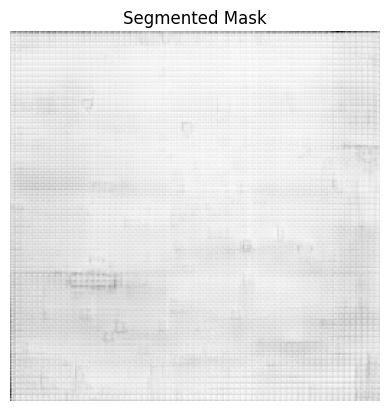

In [ ]:
 # Move the mask to CPU and convert to NumPy array
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_33_89_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt
# Correctly preparing the mask for visualization
plt.imshow(predicted_mask[0].squeeze(), cmap='gray')  # Use .squeeze() to remove the singular dimension
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

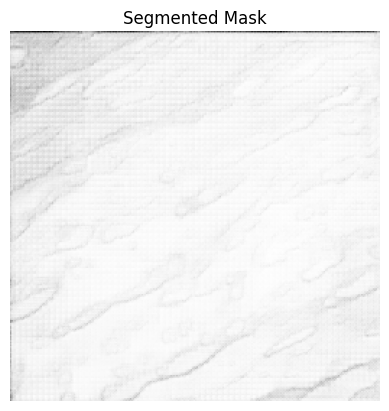

In [ ]:
 # Move the mask to CPU and convert to NumPy array
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_68_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt
# Correctly preparing the mask for visualization
plt.imshow(predicted_mask[0].squeeze(), cmap='gray')  # Use .squeeze() to remove the singular dimension
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

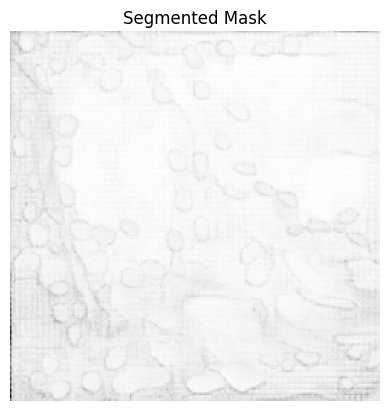

In [ ]:
 # Move the mask to CPU and convert to NumPy array
image_path = "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_104_Subset1_Train_1.tiff"
predicted_mask = segment_image(image_path)

# Visualizing the result
import matplotlib.pyplot as plt
# Correctly preparing the mask for visualization
plt.imshow(predicted_mask[0].squeeze(), cmap='gray')  # Use .squeeze() to remove the singular dimension
plt.title("Segmented Mask")
plt.axis('off')
plt.show()

In [ ]:
def load_image(image_path):
    """Load an image from the specified path."""
    return Image.open(image_path)

def load_mask(mask_path):
    """Load a mask from the specified path."""
    mask = Image.open(mask_path)
    return np.array(mask)

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

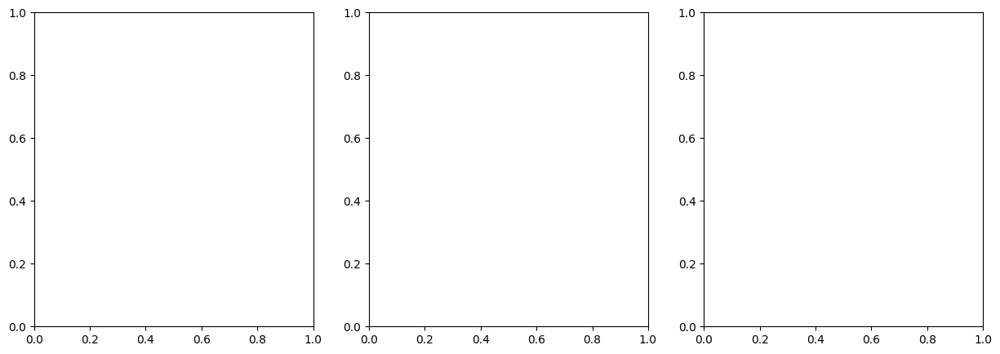

In [ ]:
def plot_images_and_masks(image_paths, mask_paths):
    fig, axes = plt.subplots(nrows=len(image_paths), ncols=3, figsize=(15, 5 * len(image_paths)))
    
    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        # Load and display the original image
        image = load_image(image_path)
        axes[idx, 0].imshow(image, cmap='gray')
        axes[idx, 0].set_title('Original Image')
        axes[idx, 0].axis('off')

        # Load and display the ground truth mask
        mask = load_mask(mask_path)
        axes[idx, 1].imshow(mask, cmap='gray')
        axes[idx, 1].set_title('Ground Truth Mask')
        axes[idx, 1].axis('off')

        # Predict and display the mask
        predicted_mask = segment_image(image_path)
        axes[idx, 2].imshow(predicted_mask[0].squeeze(), cmap='gray')
        axes[idx, 2].set_title('Predicted Mask')
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Paths to your images and masks
image_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_104_Subset1_Train_1.tiff"
]
mask_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Masks/patch_121_104_Subset1_Train_1.tiff"
]

# Call the function with your paths
plot_images_and_masks(image_paths, mask_paths)

FileNotFoundError: [Errno 2] No such file or directory: 'G:\\sernetdata\\AGGC2022_train\\Processed5\\Masks\\patch_121_104_Subset1_Train_1.tiff'

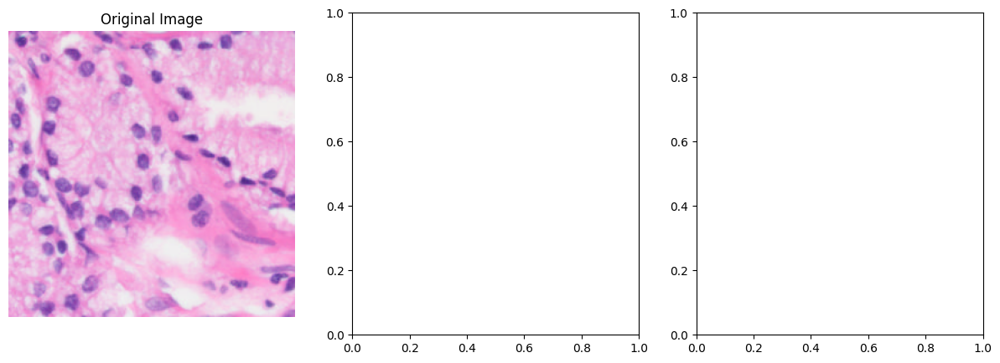

In [ ]:
def plot_images_and_masks(image_paths, mask_paths):
    num_images = len(image_paths)
    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, 5 * num_images))
    if num_images == 1:
        axes = np.array([axes])  # Convert to a 2D array for consistent indexing

    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        # Load and display the original image
        image = load_image(image_path)
        axes[idx, 0].imshow(image, cmap='gray')
        axes[idx, 0].set_title('Original Image')
        axes[idx, 0].axis('off')

        # Load and display the ground truth mask
        mask = load_mask(mask_path)
        axes[idx, 1].imshow(mask, cmap='gray')
        axes[idx, 1].set_title('Ground Truth Mask')
        axes[idx, 1].axis('off')

        # Predict and display the mask
        predicted_mask = segment_image(image_path)
        axes[idx, 2].imshow(predicted_mask[0].squeeze(), cmap='gray')
        axes[idx, 2].set_title('Predicted Mask')
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
image_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_104_Subset1_Train_1.tiff"
]
mask_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Masks/patch_121_104_Subset1_Train_1.tiff"
]

# Call the function with your paths
plot_images_and_masks(image_paths, mask_paths)

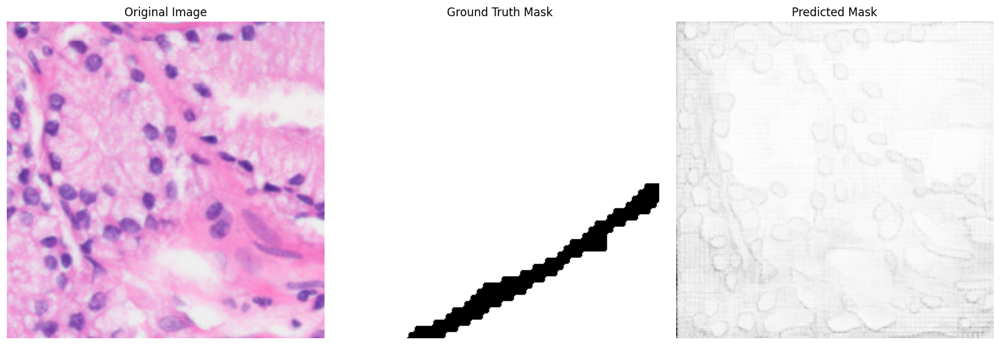

In [ ]:
def plot_images_and_masks(image_paths, mask_paths):
    num_images = len(image_paths)
    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, 5 * num_images))
    if num_images == 1:
        axes = np.array([axes])  # Convert to a 2D array for consistent indexing

    for idx, (image_path, mask_path) in enumerate(zip(image_paths, mask_paths)):
        # Load and display the original image
        image = load_image(image_path)
        axes[idx, 0].imshow(image, cmap='gray')
        axes[idx, 0].set_title('Original Image')
        axes[idx, 0].axis('off')

        # Load and display the ground truth mask
        mask = load_mask(mask_path)
        axes[idx, 1].imshow(mask, cmap='gray')
        axes[idx, 1].set_title('Ground Truth Mask')
        axes[idx, 1].axis('off')

        # Predict and display the mask
        predicted_mask = segment_image(image_path)
        axes[idx, 2].imshow(predicted_mask[0].squeeze(), cmap='gray')
        axes[idx, 2].set_title('Predicted Mask')
        axes[idx, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
image_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_104_Subset1_Train_1.tiff"
]
mask_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Masks/patch_121_104_Subset1_Train_1_mask.tiff"
]

# Call the function with your paths
plot_images_and_masks(image_paths, mask_paths)

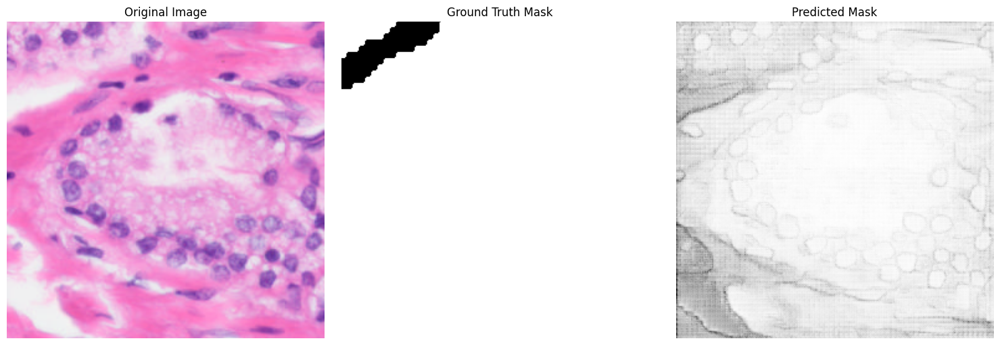

In [ ]:
# Example usage
image_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_121_105_Subset1_Train_1.tiff"
]
mask_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Masks/patch_121_105_Subset1_Train_1_mask.tiff"
]

# Call the function with your paths
plot_images_and_masks(image_paths, mask_paths)

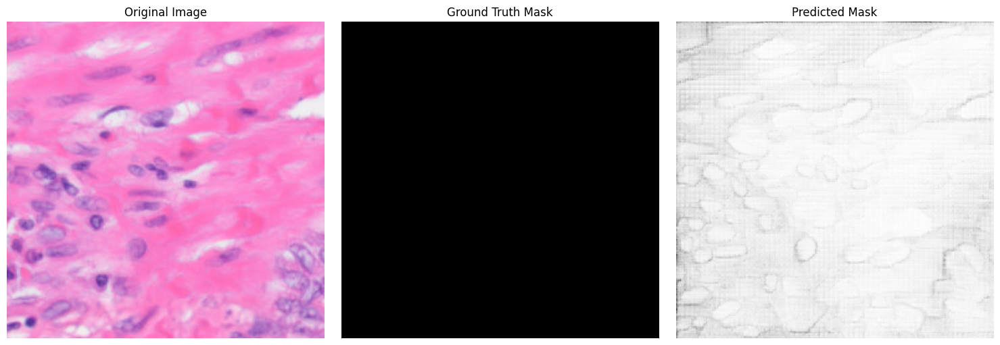

In [ ]:
image_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Images/patch_101_106_Subset1_Train_1.tiff"
]
mask_paths = [
    "G:/sernetdata/AGGC2022_train/Processed5/Masks/patch_101_106_Subset1_Train_1_mask.tiff"
]

# Call the function with your paths
plot_images_and_masks(image_paths, mask_paths)